# **DOMAIN ADAPTATION ALGORITHMS EVALUATION**

## **LIBRARIES**

In [4]:
import os
import torch
import numpy as np
import soundfile as sf
import librosa
from tqdm import tqdm
import yaml
import pandas as pd
import seaborn as sns
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_val_predict
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.utils import resample
from scipy.stats import wasserstein_distance
from typing import Union, Tuple
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [3]:
# Load audio processing constants from config.yaml
with open("config.yaml", "r") as f:
    config = yaml.safe_load(f)

SAMPLING_RATE = config["audio_processing"]["sampling_rate"] # Resample the audio files with frequency 4 kHz, since wheezes and crackles are typically within frequency range 0–2 kHz
FRAME_LENGTH = config["audio_processing"]["frame_length"] # Use window size of 60 ms for each cycle
HOP_LENGTH = config["audio_processing"]["hop_length"] # Use 50% overlap
N_MFCC = config["audio_processing"]["n_mfcc"] # Extract the first 13 MFCCs
N_MELS = config["audio_processing"]["n_mels"] # Use 64 Mel Banks to extract the Log-Mel Spectrograms
F_HI = config["audio_processing"]["f_hi"] # Boundary frequency for VLTP is set to 2 kHz
TARGET_DURATION = config["audio_processing"]["target_duration"] # Fix the duration of each cycle to 8 s

FRAME_SIZE = int(FRAME_LENGTH*SAMPLING_RATE) # Calculate the amount of samples per frame
HOP_SIZE = int(HOP_LENGTH*SAMPLING_RATE) #  Calculate the amount of samples per hop

# Load basic paths from config.yaml
RAW_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["raw_cycle_folder"])
AUG_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["aug_cycle_folder"])
CLEANED_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["cleaned_cycle_folder"])
TRAINING_SET_FOLDER = os.path.join(os.getcwd(), config["paths"]["training_set_folder"])
TEST_SET_FOLDER = os.path.join(os.getcwd(), config["paths"]["test_set_folder"])

# Feature names 
FEATURE_NAMES = (
    [f"MFCC_{i}" for i in range(N_MFCC)] +
    ["Spectral Centroid", "Spectral Bandwidth", "Zero Crossing Rate", "RMS Energy",
     "Spectral Rolloff", "Spectral Flux", "Spectral Flatness"] 
    + [f"Log Mel_{i}" for i in range(N_MELS)] + ["On Set Envelope"]
)

# Number of features used
N_FEATURES = len(FEATURE_NAMES) 

# Device names 
DEVICES = ["AKGC417L", "LittC2SE", "Litt3200", "Meditron"]
REFERENCE_DEVICE = "Meditron"

In [5]:
# Load training and test sets
train_df = pd.read_csv(os.path.join(TRAINING_SET_FOLDER, "raw_training_set.csv"))
final_train_df = pd.read_csv(os.path.join(TRAINING_SET_FOLDER, "training_set.csv"))
augmented_labels_df = pd.read_csv(os.path.join(TRAINING_SET_FOLDER, "augmented_training_set.csv"))
test_df = pd.read_csv(os.path.join(TEST_SET_FOLDER, "test_set.csv"))

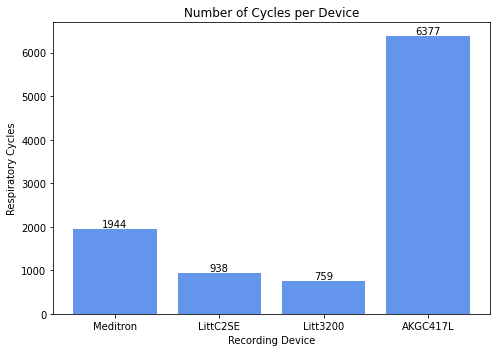

In [6]:
device_counts = Counter()

# Count the initial respiratory cycles of each device
for fname in os.listdir(CLEANED_CYCLE_FOLDER):
    if fname.endswith(".wav"):
        matched_device = next((d for d in DEVICES if d in fname), None)
        if matched_device:
            device_counts[matched_device] += 1

# Bar plot
plt.figure(figsize=(7, 5))
plt.bar(device_counts.keys(), device_counts.values(), color="cornflowerblue")
plt.title("Number of Cycles per Device")
plt.xlabel("Recording Device")
plt.ylabel("Respiratory Cycles")

for i, (device, count) in enumerate(device_counts.items()):
    plt.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [5]:
# Extract device names from training filenames 
device_labels = []
for fname in final_train_df['file']:
    matched_device = next((d for d in DEVICES if d in fname), None)
    device_labels.append(matched_device)

np.save("training_devices.npy", np.array(device_labels))

In [6]:
# Extract device names from test filenames 
device_labels = []
for fname in test_df['file']:
    matched_device = next((d for d in DEVICES if d in fname), None)
    device_labels.append(matched_device)

np.save("test_devices.npy", np.array(device_labels))

In [7]:
def extract_device(filename):
    for device in DEVICES:
        if device in filename:
            return device
    return "Unknown"

train_df["device"] = train_df["file"].apply(extract_device)
device_class_counts = train_df.groupby(["class", "device"]).size().unstack().fillna(0).astype(int)
print(device_class_counts)

device   AKGC417L  Litt3200  LittC2SE  Meditron
class                                          
Crackle      1234        22        64       171
Normal       1537       266       287       823
Wheeze        401        88        98       122


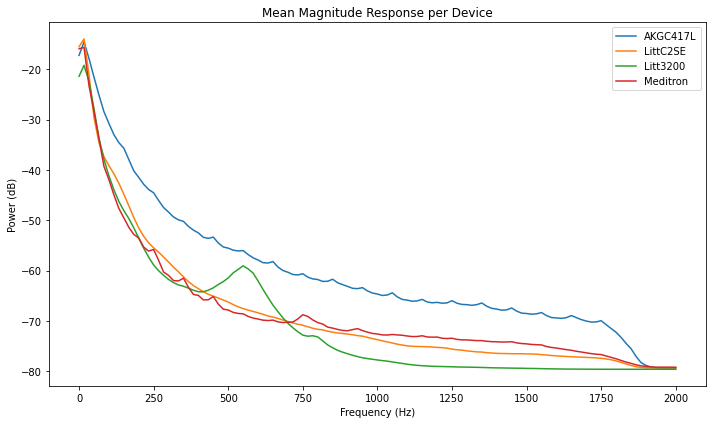

In [29]:
device_signals = {d: [] for d in DEVICES}

for fname in os.listdir(RAW_CYCLE_FOLDER):
    if fname.endswith(".wav"):
        device = next((d for d in DEVICES if d in fname), None)
        if device:
            y, _ = librosa.load(os.path.join(RAW_CYCLE_FOLDER, fname), sr=SAMPLING_RATE)
            device_signals[device].append(y)

# Calculate the mean magnitude response of each device
plt.figure(figsize=(10, 6))

for device in DEVICES:
    signals = device_signals[device]

    all_psd = []
    for y in signals:
        # STFT to Power Spectrogram
        S = np.abs(librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE))**2
        S_db = librosa.power_to_db(S, ref=np.max)
        mean_spectrum = np.mean(S_db, axis=1)  # Get mean value over time
        all_psd.append(mean_spectrum)

    avg_psd = np.mean(np.stack(all_psd), axis=0)
    freqs = librosa.fft_frequencies(sr=SAMPLING_RATE, n_fft=FRAME_SIZE)
    plt.plot(freqs, avg_psd, label=device)

plt.title("Mean Magnitude Response per Device")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power (dB)")
plt.legend()
plt.tight_layout()
plt.show()

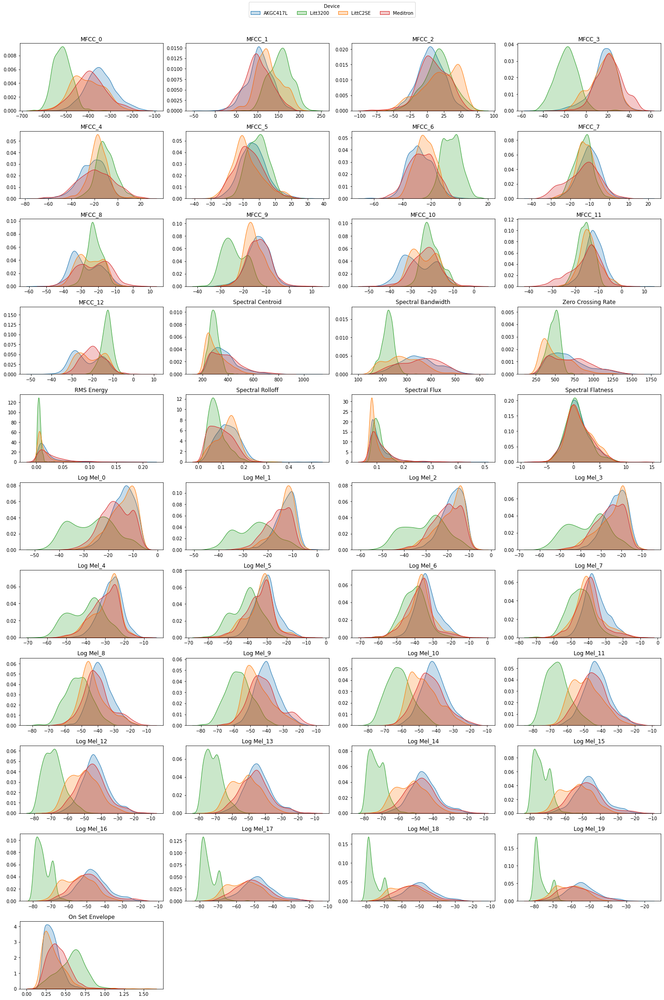

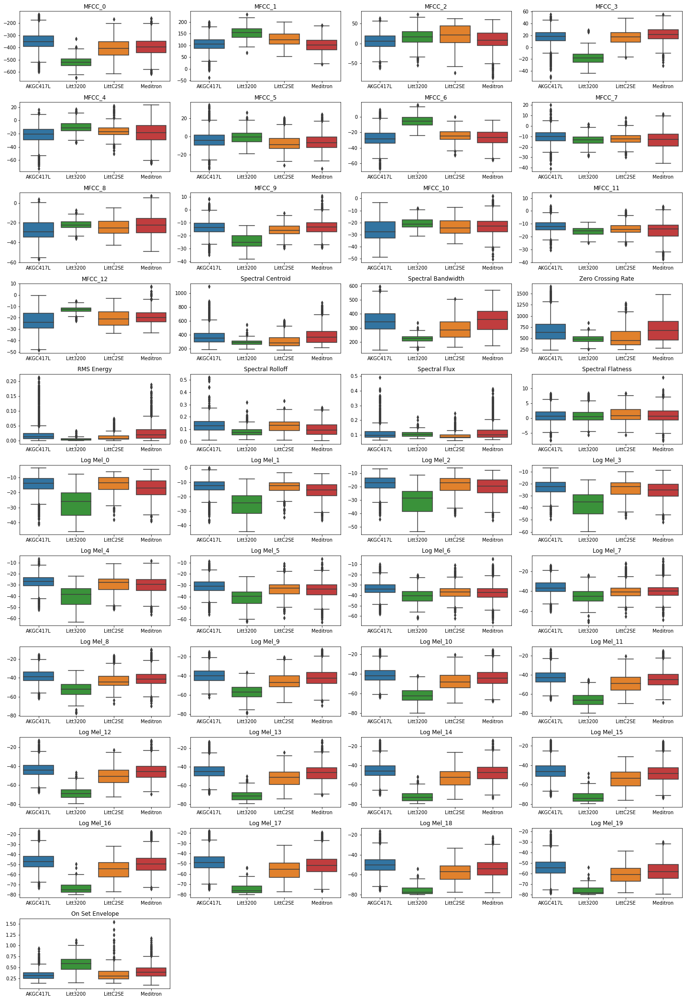

In [426]:
from utils.plots import plot_feature_distributions_by_device

# Load training set data
training_features_mean = np.load("training_features_mean.npy")  
training_devices = np.load("training_devices.npy")  

plot_feature_distributions_by_device(training_features_mean, training_devices, FEATURE_NAMES)

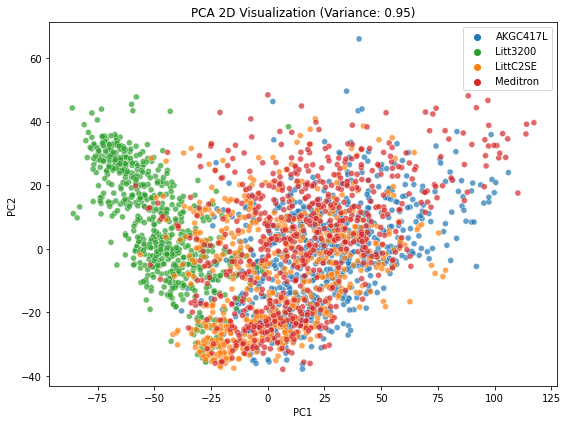

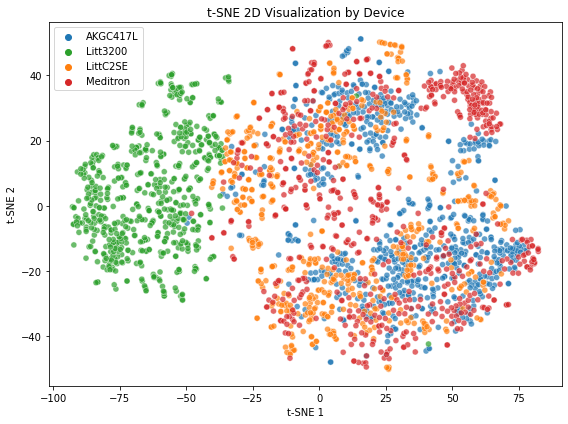

In [9]:
from utils.plots import perform_pca_and_tsne_by_device

training_features_flattened = np.load("training_features_flattened.npy")

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_flattened[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Detect the existing domain ahift using a Domain Classifier

Accuracy per fold: [0.8216 0.7875 0.7814 0.8251 0.8061]
Mean accuracy: 0.8043 ± 0.0176


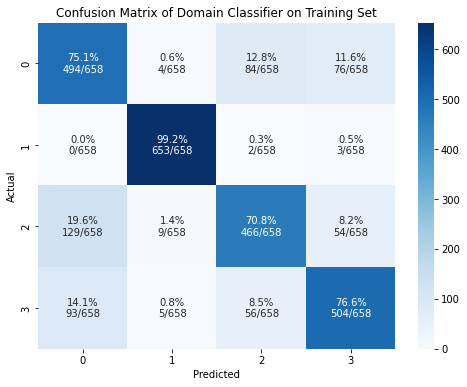

In [10]:
# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()

The analysis reveals that there is a moderate domain shift between devices in the dataset. This is supported by two key observations: 

(1) the PCA and t-SNE visualizations show partial clustering by device, with some overlap but also noticeable separation — particularly for certain devices like Litt3200 

(2) the domain classifier achieves an accuracy of approximately 58% on a balanced dataset, which is significantly higher than random guessing (25%). This indicates that device identity influences the feature space.

### **SPECTRUM CORRECTION**

In [68]:
from domain_adaptation_algorithms.aligned_spectrum_correction import *

device_segments = {device: {} for device in DEVICES}

for _, row in train_df.iterrows():
    fname = row["file"]
    class_name = row["class"]  
    device = next((d for d in DEVICES if d in fname), None)
    if device:
        path = os.path.join(RAW_CYCLE_FOLDER, fname)
        y, _ = librosa.load(path, sr=SAMPLING_RATE)
        device_segments[device].setdefault(class_name, []).append(y)

# Create aligned_segments (list of dicts)
aligned_segments = []
classes = set(train_df["class"])
min_len_per_class = {
    c: min(len(device_segments[d].get(c, [])) for d in DEVICES)
    for c in classes
}

for class_name in classes:
    for i in range(min_len_per_class[class_name]):
        segment = {"class": class_name}
        for device in DEVICES:
            segment[device] = device_segments[device][class_name][i]
        aligned_segments.append(segment)

# Fit Spectrum Correction
correction = SpectrumCorrection(num_fft=FRAME_SIZE, hop_length=HOP_SIZE)
correction.fit(aligned_segments, reference_device=REFERENCE_DEVICE)

In [74]:
import os
import numpy as np
import librosa
import soundfile as sf

class SpectrumCorrection:
    """Applies spectrum correction based on average STFT spectra from aligned segments.

    Args:
        num_fft (int): FFT window size.
        hop_length (int): Hop length for STFT.
        sub_mean (bool): Whether to subtract the mean before STFT.
    """

    def __init__(self, num_fft, hop_length, sub_mean=True):
        self._num_fft = num_fft
        self._hop_length = hop_length
        self._sub_mean = sub_mean
        self.coefficients = None

    def _spectrum(self, audio):
        if self._sub_mean:
            audio -= np.mean(audio)
        stft = librosa.stft(audio, n_fft=self._num_fft, hop_length=self._hop_length)
        return np.mean(np.abs(stft), axis=-1)

    def _reduce(self, spectra, use_median, axis):
        return np.median(spectra, axis=axis) if use_median else np.mean(spectra, axis=axis)

    def fit(self, aligned_segments, reference, use_median=False):
        """Fit the correction coefficients from aligned segments."""
        coefficients = {}
        device_spectra = {}

        for segment in aligned_segments:
            spectra = {
                device: self._spectrum(audio)
                for device, audio in segment.items()
                if not np.isnan(audio).any()
            }

            base_spec = self._reference_spectrum(reference, spectra)

            for device, spec in spectra.items():
                ratio = base_spec / (spec + 1e-6)
                coefficients.setdefault(device, []).append(ratio)
                device_spectra.setdefault(device, []).append(spec)

        self.coefficients = {
            device: self._reduce(specs, use_median, axis=0)
            for device, specs in coefficients.items()
        }

        # 👉 Store average spectra for all devices (used for confidence-aware correction later)
        self.device_avg_spectra = {
            device: self._reduce(specs, use_median, axis=0)
            for device, specs in device_spectra.items()
        }


    def _reference_spectrum(self, reference, spectra):
        if isinstance(reference, str):
            return spectra[reference]
        elif isinstance(reference, list):
            return np.mean([spectra[d] for d in reference if d in spectra], axis=0)
        else:
            raise ValueError("Invalid reference specification.")

    def transform_stft(self, stft, device, frequency_axis=0):
        """Apply spectrum correction directly to STFT."""
        shape = np.ones(stft.ndim, int)
        shape[frequency_axis] = -1
        return stft * self.coefficients[device].reshape(shape)

    def transform_wave(self, recording, device, return_stft=False):
        """Apply correction to time-domain signal."""
        if self._sub_mean:
            recording = recording - np.mean(recording)

        stft = librosa.stft(recording, n_fft=self._num_fft, hop_length=self._hop_length)
        stft = self.transform_stft(stft, device, frequency_axis=0)

        if return_stft:
            return stft
        return librosa.istft(stft, hop_length=self._hop_length, length=len(recording))

In [75]:
#from domain_adaptation_algorithms.spectrum_correction import *

device_segments = {device: [] for device in DEVICES}

for _, row in train_df.iterrows():
    fname = row["file"]
    device = next((d for d in DEVICES if d in fname), None)
    if device:
        path = os.path.join(RAW_CYCLE_FOLDER, fname)
        y, _ = librosa.load(path, sr=SAMPLING_RATE)
        device_segments[device].append(y)

# Create aligned_segments 
min_len = min(len(v) for v in device_segments.values())
aligned_segments = []

for i in range(min_len):
    segment = {}
    for device in DEVICES:
        segment[device] = device_segments[device][i]
    aligned_segments.append(segment)

REFERENCE_DEVICE = 'Meditron'

# Fit SpectrumCorrection on raw training data
correction = SpectrumCorrection(num_fft=FRAME_SIZE, hop_length=HOP_SIZE)
correction.fit(aligned_segments, reference=REFERENCE_DEVICE)

In [14]:
SC_TRAIN_FOLDER = "corrected_train_sc"
os.makedirs(SC_TRAIN_FOLDER, exist_ok=True)

# Apply Spectrum Correction only on non-reference devices of preprocessed training set 
for fname in tqdm(final_train_df["file"], desc="Applying Spectrum Correction on training set"):
    device = next((d for d in DEVICES if d in fname), None)
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TRAIN_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Spectrum Correction on training set: 100%|██████████| 8739/8739 [01:04<00:00, 134.75it/s]


In [69]:
SC_TRAIN_FOLDER = "corrected_train_sc_2"
os.makedirs(SC_TRAIN_FOLDER, exist_ok=True)

for _, row in tqdm(final_train_df.iterrows(), total=len(final_train_df), desc="Applying Aligned Spectrum Correction on training set"):
    fname = row["file"]
    class_name = row["class"]  
    device = next((d for d in DEVICES if d in fname), None)

    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TRAIN_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)

    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device=device, class_name=class_name)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Aligned Spectrum Correction on training set:   0%|          | 0/8739 [00:00<?, ?it/s]

Applying Aligned Spectrum Correction on training set: 100%|██████████| 8739/8739 [01:55<00:00, 75.70it/s] 


In [15]:
SC_TEST_FOLDER = "corrected_test_sc"
os.makedirs(SC_TEST_FOLDER, exist_ok=True)

# Apply Spectrum Correction only on non-reference devices of testing set 
for fname in tqdm(test_df["file"], desc="Applying Spectrum Correction on test set"):
    device = next((d for d in DEVICES if d in fname), None)
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TEST_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Spectrum Correction on test set: 100%|██████████| 1279/1279 [00:10<00:00, 124.75it/s]


In [70]:
SC_TEST_FOLDER = "corrected_test_sc_2"
os.makedirs(SC_TEST_FOLDER, exist_ok=True)

for _, row in tqdm(test_df.iterrows(), total=len(test_df), desc="Applying Aligned Spectrum Correction on test set"):
    fname = row["file"]
    class_name = row["class"]  
    device = next((d for d in DEVICES if d in fname), None)

    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TEST_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)

    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device=device, class_name=class_name)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Aligned Spectrum Correction on test set: 100%|██████████| 1279/1279 [00:26<00:00, 48.76it/s]


Spectrum Correction using softmax porbabilities for transforming test files

In [68]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler, LabelEncoder

def softmax(logits):
    exps = np.exp(logits - np.max(logits, axis=1, keepdims=True))
    return exps / np.sum(exps, axis=1, keepdims=True)

def squash_probs(probs, power=0.5):
    """
    Apply squashing to reduce the dominance of large probabilities.

    Args:
        probs (np.ndarray): Probabilities vector, shape (num_classes,)
        power (float): Squashing exponent. If power < 1, it flattens the distribution.

    Returns:
        np.ndarray: Squashed probabilities, still summing to 1
    """
    probs = np.power(probs, power)
    return probs / np.sum(probs)

X_train = np.load("training_features_mean.npy")
y_train = np.load("training_labels.npy")
X_test = np.load("test_features_mean.npy")

scaler = MinMaxScaler(feature_range=(-1, 1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

# Logits from kNN 
probs = knn.predict_proba(X_test)  # shape: (cycles, labels)
eps = 1e-8  # για αποφυγή log(0)
logits = np.log(probs + eps)

# Calibration using temperature scaling
def calibrate_probs(logits, T=2.0):
    scaled_logits = logits / T
    soft_probs = softmax(scaled_logits)
    soft_probs = np.clip(soft_probs, 1e-6, 1.0)
    return soft_probs

soft_probs = calibrate_probs(logits)

def squash_except_max(probs, power=0.5):
    squashed = np.zeros_like(probs)
    max_indices = np.argmax(probs, axis=1)
    for i, max_idx in enumerate(max_indices):
        for j in range(probs.shape[1]):
            if j == max_idx:
                squashed[i, j] = probs[i, j]  # keep max
            else:
                squashed[i, j] = probs[i, j] ** power  # squash
        squashed[i] /= np.sum(squashed[i])  # re-normalize
    return squashed

squashed_probs = squash_except_max(soft_probs, power=0.3)

In [69]:
unique_values = np.unique(squashed_probs)
print("Unique softmax probability values:", unique_values)

Unique softmax probability values: [0.04049058 0.04049058 0.05603273 0.18813477 0.40593261 0.41527523
 0.54423419 0.88793455]


In [ ]:
import os
import numpy as np
import librosa
import soundfile as sf
import matplotlib.pyplot as plt

class SpectrumCorrection:
    def __init__(self, num_fft, hop_length, sub_mean=True):
        self._num_fft = num_fft
        self._hop_length = hop_length
        self._sub_mean = sub_mean
        self.coefficients = None  # {device: {class_name: coeff}}
        self.class_list = ['Crackle', 'Normal', 'Wheeze'] 

    def _spectrum(self, audio):
        if self._sub_mean:
            audio = audio - np.mean(audio)
        stft = librosa.stft(audio, n_fft=self._num_fft, hop_length=self._hop_length)
        return np.mean(np.abs(stft), axis=-1)

    def _reduce(self, spectra, use_median, axis):
        return np.median(spectra, axis=axis) if use_median else np.mean(spectra, axis=axis)

    def fit(self, aligned_segments, reference_device, use_median=False):
        """
        Args:
            aligned_segments: list of dicts
                Each dict: { "class": class_name, device1: audio1, device2: audio2, ... }
            reference_device: str (name of reference device)
        """
        coefficients = {}

        # Collect spectra per device/class
        spectra_per_device_class = {}  # {device: {class_name: [spectra]}}
        for segment in aligned_segments:
            class_name = segment["class"]
            for device, audio in segment.items():
                if device == "class":
                    continue
                if np.isnan(audio).any():
                    continue
                spec = self._spectrum(audio)
                spectra_per_device_class \
                    .setdefault(device, {}) \
                    .setdefault(class_name, []) \
                    .append(spec)

        # Compute reference spectra
        reference_spectra = {
            class_name: self._reduce(spectra_per_device_class[reference_device][class_name], use_median, axis=0)
            for class_name in spectra_per_device_class[reference_device]
        }

        # Compute correction ratios
        for device, class_spectra in spectra_per_device_class.items():
            if device == reference_device:
                continue
            coefficients[device] = {}
            for class_name, specs in class_spectra.items():
                device_spec = self._reduce(specs, use_median, axis=0)
                ratio = reference_spectra[class_name] / (device_spec + 1e-6)
                coefficients[device][class_name] = ratio

        self.coefficients = coefficients

    def transform_stft(self, stft, device, class_name, frequency_axis=0):
        coeffs = self.coefficients[device][class_name]
        shape = np.ones(stft.ndim, int)
        shape[frequency_axis] = -1
        return stft * coeffs.reshape(shape)

    def transform_wave(self, recording, device, class_name=None, probs=None, return_stft=False):
        """
        Apply spectrum correction with adaptive strategy based on confidence:
        - High confidence: use only the dominant class coefficient
        - Medium confidence: average top-2 class coefficients
        - Low confidence: sqrt-weighted average over all class coefficients

        Args:
            recording: np.ndarray, audio signal
            device: str, device name
            class_name: str, known class (used in training)
            probs: np.ndarray of shape (num_classes,), soft labels (used in test)
            return_stft: bool, if True returns STFT instead of waveform

        Returns:
            np.ndarray: corrected waveform or STFT
        """
        if self._sub_mean:
            recording = recording - np.mean(recording)
        stft = librosa.stft(recording, n_fft=self._num_fft, hop_length=self._hop_length)

        if class_name is not None:
            stft = self.transform_stft(stft, device, class_name, frequency_axis=0)
        elif probs is not None:
            class_list = self.class_list
            if device not in self.coefficients:
                raise ValueError(f"No correction coefficients for device '{device}'")
            missing = [c for c in class_list if c not in self.coefficients[device]]
            if missing:
                raise ValueError(f"Missing correction coefficients for classes {missing} in device {device}")

            max_prob = np.max(probs)
            coeffs = None

            if max_prob >= 0.85:
                # Case 1: High confidence → use only the dominant class
                dominant_class = class_list[np.argmax(probs)]
                coeffs = self.coefficients[device][dominant_class]

            elif 0.4 <= max_prob < 0.85:
                # Case 2: Medium confidence → average top-2 classes
                top2_idx = np.argsort(probs)[-2:]
                c1, c2 = class_list[top2_idx[0]], class_list[top2_idx[1]]
                coeff1 = self.coefficients[device][c1]
                coeff2 = self.coefficients[device][c2]
                coeffs = (coeff1 + coeff2) / 2

            else:
                # Case 3: Low confidence → sqrt-weighted average over all
                sqrt_probs = np.sqrt(probs)
                sqrt_probs /= np.sum(sqrt_probs)
                coeffs = np.zeros_like(next(iter(self.coefficients[device].values())))
                for weight, cname in zip(sqrt_probs, class_list):
                    coeffs += weight * self.coefficients[device][cname]

            shape = np.ones(stft.ndim, int)
            shape[0] = -1
            stft = stft * coeffs.reshape(shape)
        else:
            raise ValueError("Must provide either `class_name` or `probs`.")

        if return_stft:
            return stft
        return librosa.istft(stft, hop_length=self._hop_length, length=len(recording))


    def plot_correction_coefficients(self, device_files, reference_device, k=4, sr=4000, save_dir=None):
        """
        Plot correction ratios (reference / device spectrum) for the first `k` wav files per device.

        Args:
            device_files (dict): {device: list of (filename, audio)}.
            reference_device (str): Name of reference device.
            k (int): Number of files to plot per device.
            sr (int): Sampling rate (used for x-axis in Hz).
            save_dir (str, optional): If given, saves plots to this directory.
        """
        ref_spec = None
        for _, audio in device_files.get(reference_device, []):
            if not np.isnan(audio).any():
                ref_spec = self._spectrum(audio)
                break
        if ref_spec is None:
            raise ValueError("No valid reference spectrum found.")

        for device, file_list in device_files.items():
            for i, (fname, audio) in enumerate(file_list[:k]):
                if np.isnan(audio).any():
                    continue

                spec = self._spectrum(audio)
                ratio = ref_spec / (spec + 1e-6)
                freqs = np.linspace(0, sr / 2, len(ratio))

                plt.figure(figsize=(10, 5))
                plt.plot(freqs, np.ones_like(ratio), label="Reference", linewidth=2)
                plt.plot(freqs, ratio, label=f"{device} | {fname}", linewidth=2)
                plt.title(f"Correction Coefficients - {device} | File {i+1}")
                plt.xlabel("Frequency (Hz)")
                plt.ylabel("Correction Coefficient")
                plt.legend()

                if save_dir:
                    os.makedirs(save_dir, exist_ok=True)
                    out_path = os.path.join(save_dir, f"{device}_{i}_correction.png")
                    plt.savefig(out_path)
                    plt.close()
                else:
                    plt.show()

device_segments = {device: {} for device in DEVICES}

for _, row in train_df.iterrows():
    fname = row["file"]
    class_name = row["class"]  
    device = next((d for d in DEVICES if d in fname), None)
    if device:
        path = os.path.join(RAW_CYCLE_FOLDER, fname)
        y, _ = librosa.load(path, sr=SAMPLING_RATE)
        device_segments[device].setdefault(class_name, []).append(y)

# Create aligned_segments (list of dicts)
aligned_segments = []
classes = set(train_df["class"])
min_len_per_class = {
    c: min(len(device_segments[d].get(c, [])) for d in DEVICES)
    for c in classes
}

for class_name in classes:
    for i in range(min_len_per_class[class_name]):
        segment = {"class": class_name}
        for device in DEVICES:
            segment[device] = device_segments[device][class_name][i]
        aligned_segments.append(segment)

REFERENCE_DEVICE='Meditron'

# Fit Spectrum Correction
correction = SpectrumCorrection(num_fft=FRAME_SIZE, hop_length=HOP_SIZE)
correction.fit(aligned_segments, reference_device=REFERENCE_DEVICE)

In [ ]:
SC_TRAIN_FOLDER = "corrected_train_sc_3"
os.makedirs(SC_TRAIN_FOLDER, exist_ok=True)

# Apply Spectrum Correction on training set (only non-reference devices)
for _, row in tqdm(final_train_df.iterrows(), total=len(final_train_df), desc="Applying Spectrum Correction on training set"):
    fname = row["file"]
    class_name = row["class"]  
    device = next((d for d in DEVICES if d in fname), None)

    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TRAIN_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)

    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device=device, class_name=class_name)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Spectrum Correction on training set: 100%|██████████| 8739/8739 [01:44<00:00, 83.24it/s] 


In [ ]:
SC_TEST_FOLDER = "corrected_test_sc_3"
os.makedirs(SC_TEST_FOLDER, exist_ok=True)

for i, row in tqdm(test_df.iterrows(), total=len(test_df), desc="Applying Aligned Spectrum Correction on test set"):
    fname = row["file"]
    device = next((d for d in DEVICES if d in fname), None)

    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TEST_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)

    if device != REFERENCE_DEVICE:
        probs = squashed_probs[i]  
        y = correction.transform_wave(y, device=device, probs=probs)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Aligned Spectrum Correction on test set: 100%|██████████| 1279/1279 [00:14<00:00, 87.95it/s] 


Process correction vectors

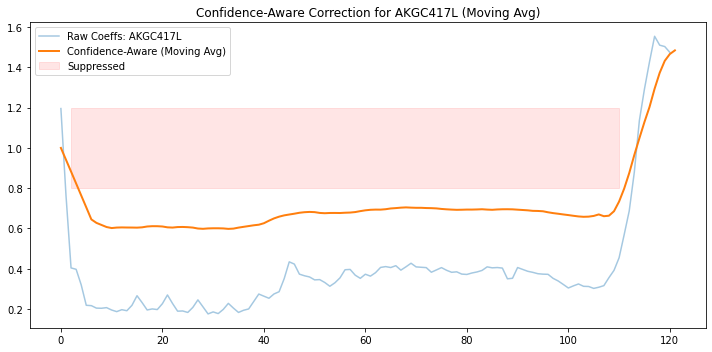

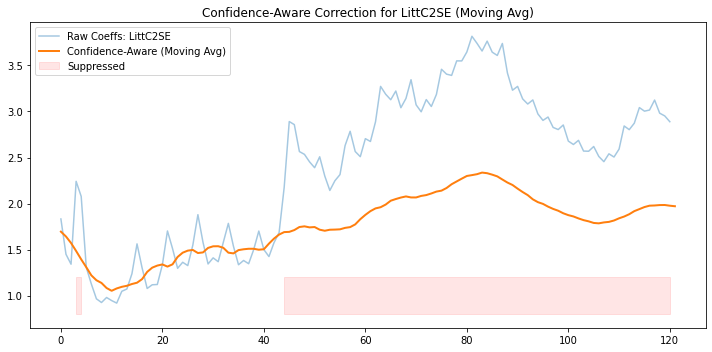

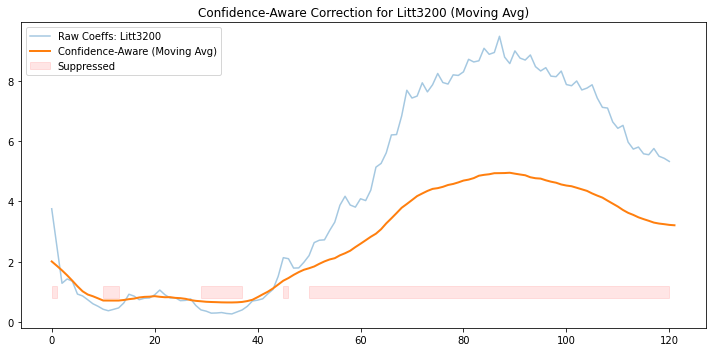

In [77]:
import numpy as np
import matplotlib.pyplot as plt

def moving_average(x, window_size=5):
    """Apply moving average with symmetric padding at the edges."""
    pad = window_size // 2
    padded = np.pad(x, pad_width=pad, mode='edge')
    return np.convolve(padded, np.ones(window_size)/window_size, mode='valid')

def confidence_aware_correction(base_spec, device_spec, max_ratio=2.0, min_ratio=0.5, window_size=5):
    """
    Creates a correction vector with suppression of unreliable bins based on device/reference ratio,
    and applies moving average smoothing.

    Args:
        base_spec (np.ndarray): Reference spectrum.
        device_spec (np.ndarray): Device spectrum.
        max_ratio (float): Upper threshold for acceptable ratio.
        min_ratio (float): Lower threshold for acceptable ratio.
        window_size (int): Window size for moving average smoothing.

    Returns:
        smoothed: Smoothed correction vector.
        raw_coeffs: Original correction ratios (base/device).
        low_conf: Boolean mask of unreliable bins.
    """
    raw_coeffs = base_spec / (device_spec + 1e-6)
    ratio = raw_coeffs.copy()

    # Low-confidence bins
    low_conf = (ratio > max_ratio) | (ratio < min_ratio)

    # Fade low-confidence bins toward neutral
    corrected = raw_coeffs.copy()
    corrected[low_conf] = 1.0 + 0.5 * (raw_coeffs[low_conf] - 1.0)

    # Moving average smoothing
    smoothed = moving_average(corrected, window_size=window_size)
    return smoothed, raw_coeffs, low_conf

ref_spec = correction.device_avg_spectra[REFERENCE_DEVICE]

for device in correction.device_avg_spectra:
    if device == REFERENCE_DEVICE:
        continue

    dev_spec = correction.device_avg_spectra[device]
    conf_coeffs, raw_coeffs, mask = confidence_aware_correction(
        base_spec=ref_spec,
        device_spec=dev_spec,
        max_ratio=2,
        min_ratio=0.5,
        window_size=10
    )

    plt.figure(figsize=(10, 5))
    plt.plot(raw_coeffs, label=f"Raw Coeffs: {device}", alpha=0.4)
    plt.plot(conf_coeffs, label="Confidence-Aware (Moving Avg)", linewidth=2)
    plt.fill_between(np.arange(len(mask)), 0.8, 1.2, where=mask, color='red', alpha=0.1, label="Suppressed")
    plt.title(f"Confidence-Aware Correction for {device} (Moving Avg)")
    plt.legend()
    plt.tight_layout()
    plt.show()


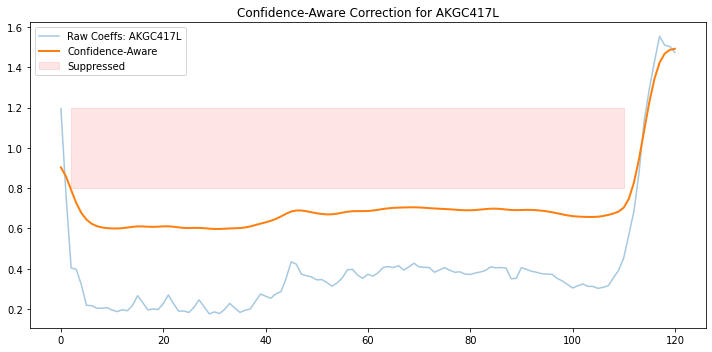

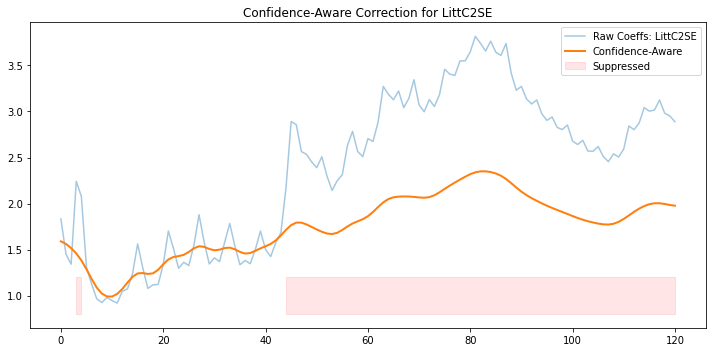

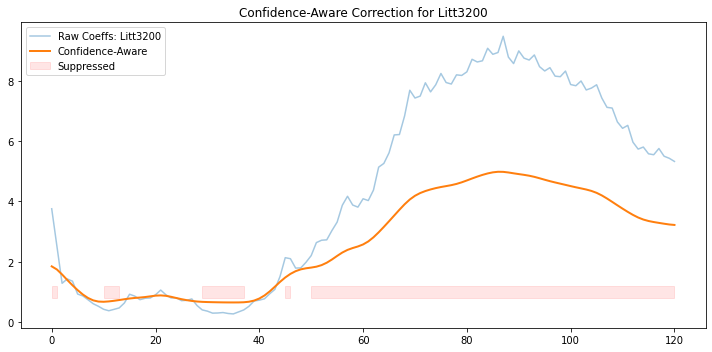

In [76]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def confidence_aware_correction(base_spec, device_spec, max_ratio=2.0, min_ratio=0.5, fade_sigma=2):
    """
    Creates a correction vector with suppression of unreliable bins based on device/reference ratio.

    Args:
        base_spec (np.ndarray): Reference spectrum.
        device_spec (np.ndarray): Device spectrum.
        max_ratio (float): Upper threshold for acceptable ratio.
        min_ratio (float): Lower threshold for acceptable ratio.
        fade_sigma (float): Sigma for smoothing the transition.

    Returns:
        np.ndarray: Smoothed, confidence-weighted correction coefficients.
    """
    raw_coeffs = base_spec / (device_spec + 1e-6)
    ratio = base_spec / (device_spec + 1e-6)

    # Low-confidence mask: ratio too high or too low
    low_conf = (ratio > max_ratio) | (ratio < min_ratio)

    # Fade low-confidence bins toward neutral
    corrected = raw_coeffs.copy()
    corrected[low_conf] = 1.0 + 0.5 * (raw_coeffs[low_conf] - 1.0)

    # Smooth the correction vector
    smoothed = gaussian_filter1d(corrected, sigma=fade_sigma)
    return smoothed, raw_coeffs, low_conf

ref_spec = correction.device_avg_spectra[REFERENCE_DEVICE]

for device in correction.device_avg_spectra:
    if device == REFERENCE_DEVICE:
        continue  # skip the reference device

    dev_spec = correction.device_avg_spectra[device]
    conf_coeffs, raw_coeffs, mask = confidence_aware_correction(
        base_spec=ref_spec,
        device_spec=dev_spec,
        max_ratio=2,
        min_ratio=0.5,
        fade_sigma=2
    )

    plt.figure(figsize=(10, 5))
    plt.plot(raw_coeffs, label=f"Raw Coeffs: {device}", alpha=0.4)
    plt.plot(conf_coeffs, label="Confidence-Aware", linewidth=2)
    plt.fill_between(np.arange(len(mask)), 0.8, 1.2, where=mask, color='red', alpha=0.1, label="Suppressed")
    plt.title(f"Confidence-Aware Correction for {device}")
    plt.legend()
    plt.tight_layout()
    plt.show()


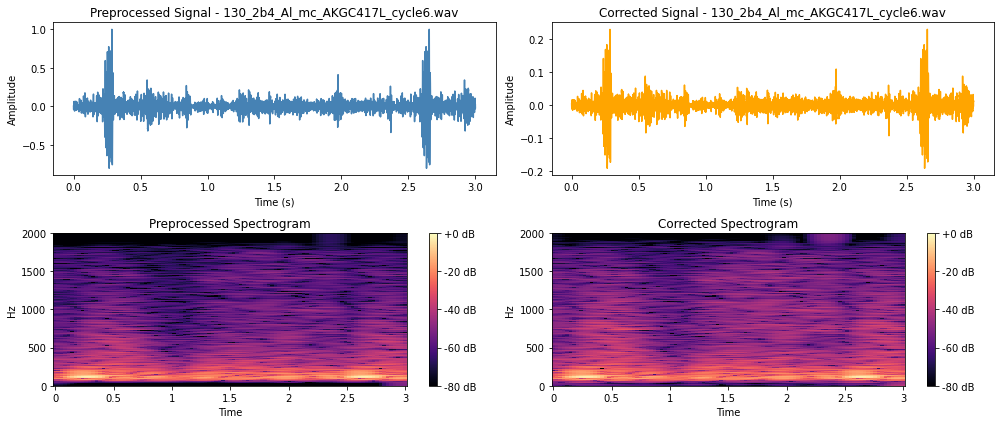

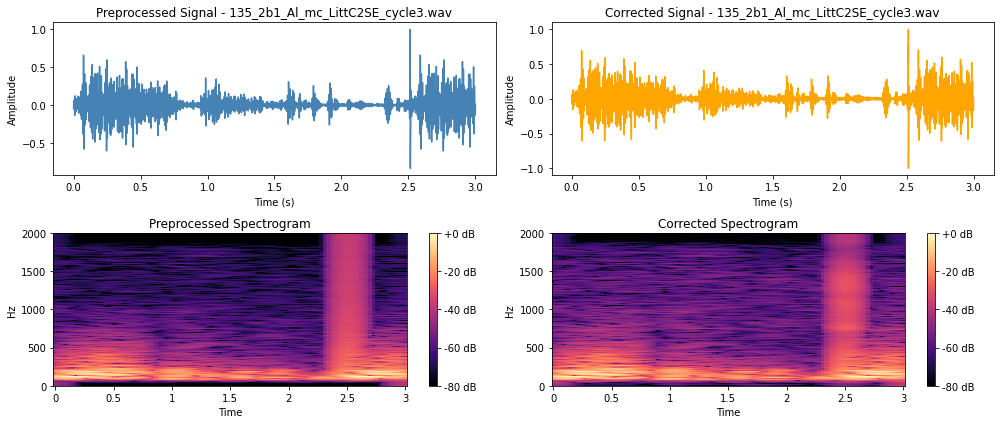

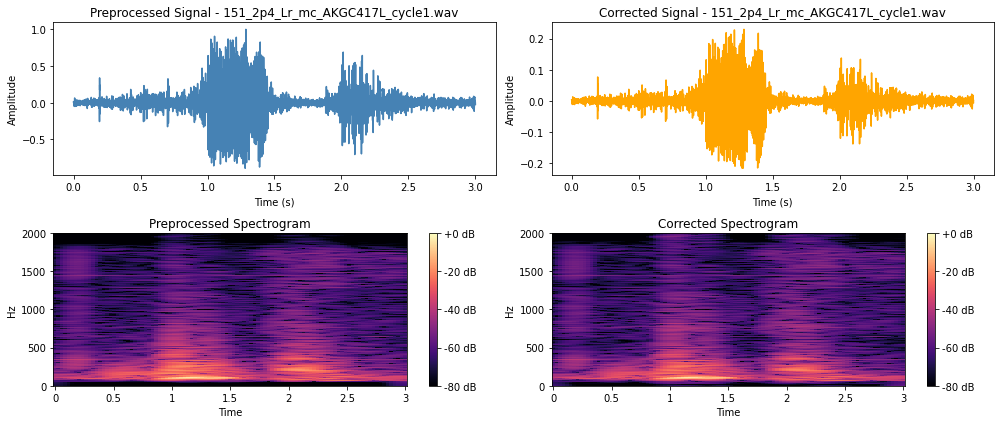

In [52]:
from utils.plots import plot_signals_after_domain_adaptation

# Get the first 3 .wav files that do not originate from the reference device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains(REFERENCE_DEVICE)]["file"].tolist()[:3]

plot_signals_after_domain_adaptation(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=SC_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

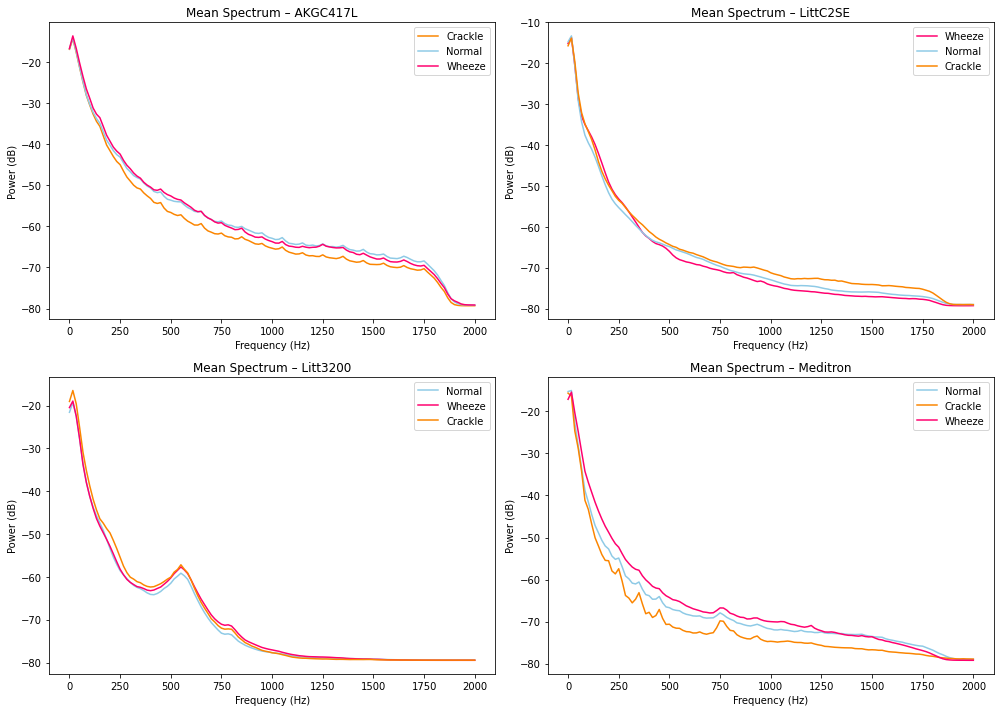

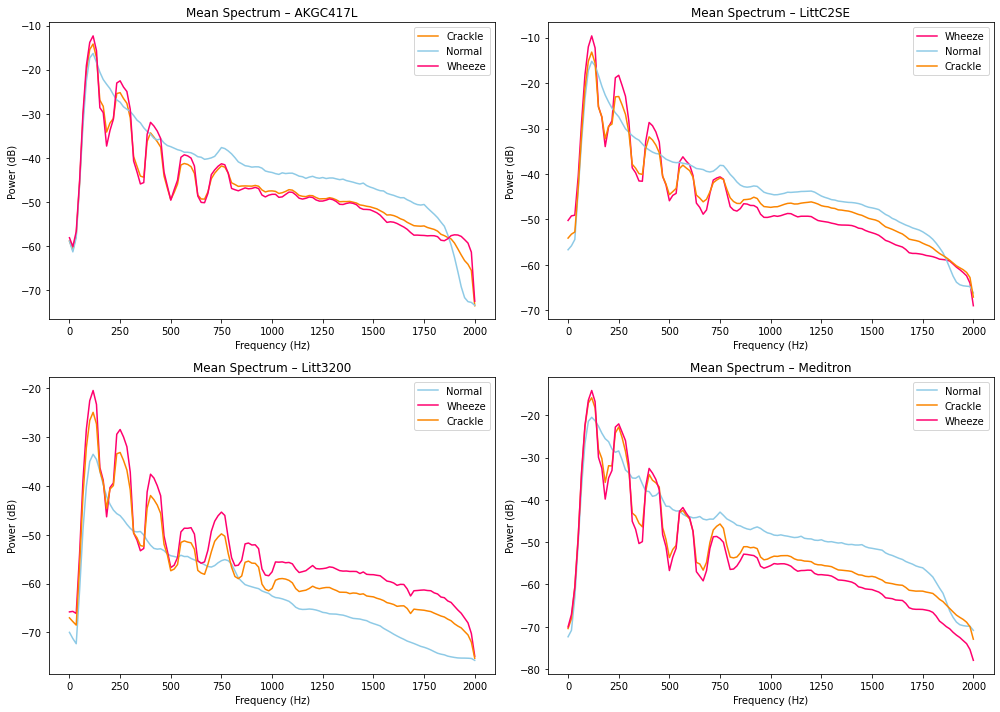

In [13]:
from utils.plots import plot_mean_spectra_per_device

plot_mean_spectra_per_device(
    folder=RAW_CYCLE_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

plot_mean_spectra_per_device(
    folder=SC_TRAIN_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

Extract acoustic features from the corrected .wav signals

In [16]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(SC_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected training set"):
    path = os.path.join(SC_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats)
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.stack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

train_features_mean = train_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("training_features_sc.npy", train_features_mean)
np.save("training_filenames_sc.npy", train_filenames_array)
np.save("training_labels_sc.npy", train_labels_array)

Extracting features from corrected training set: 100%|██████████| 8739/8739 [03:09<00:00, 46.11it/s]


In [71]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

for fname in tqdm(final_train_df["file"], desc="Extracting features from corrected training set"):
    path = os.path.join(SC_TRAIN_FOLDER, fname)

    if not os.path.exists(path):
        print(f"[Missing] {fname}")
        continue

    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats)
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.stack(train_feature_list)
train_features_mean = train_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("training_features_sc.npy", train_features_mean)

Extracting features from corrected training set: 100%|██████████| 8739/8739 [03:26<00:00, 42.38it/s]


In [17]:
# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(SC_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test set"):
    path = os.path.join(SC_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats)
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays 
test_features_array = np.stack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

test_features_mean = test_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("test_features_sc.npy", test_features_mean)
np.save("test_filenames_sc.npy", test_filenames_array)
np.save("test_labels_sc.npy", test_labels_array)

Extracting features from corrected test set: 100%|██████████| 1279/1279 [00:28<00:00, 44.50it/s]


In [72]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

for fname in tqdm(test_df["file"], desc="Extracting features from corrected test set"):
    path = os.path.join(SC_TEST_FOLDER, fname)

    if not os.path.exists(path):
        print(f"[Missing] {fname}")
        continue

    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats)
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays
test_features_array = np.stack(test_feature_list)
test_features_mean = test_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("test_features_sc.npy", test_features_mean)

Extracting features from corrected test set: 100%|██████████| 1279/1279 [00:27<00:00, 46.69it/s]


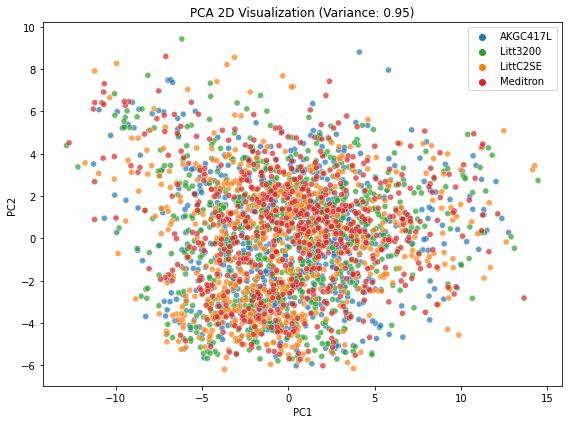

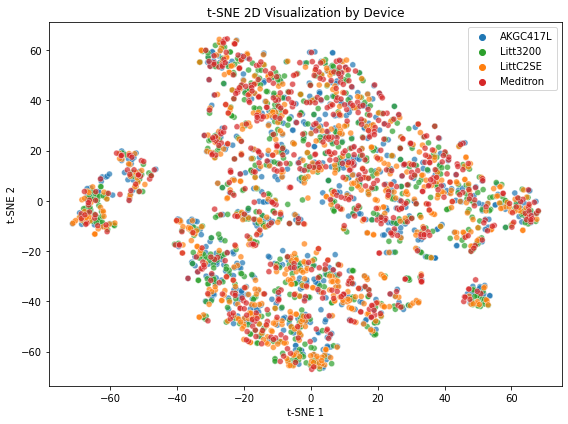

In [19]:
from utils.plots import perform_pca_and_tsne_by_device

training_features_sc = np.load("training_features_sc.npy")  

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_sc[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Accuracy per fold: [0.3036 0.2808 0.2795 0.3308 0.3498]
Mean Domain Classification Accuracy: 0.3089 ± 0.0277


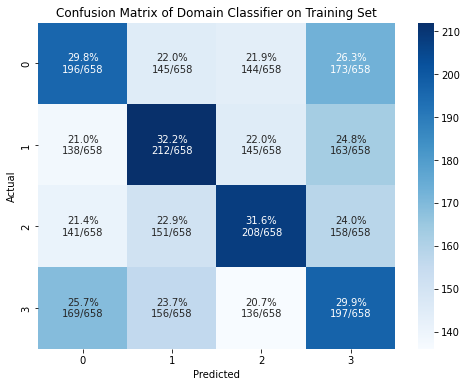

In [18]:
training_features_sc = np.load("training_features_sc.npy")  
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features_sc[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean Domain Classification Accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()

#### **DANN**

| Train Devices      | Test Device | Accuracy | Macro F1 | Macro AUC | Macro F1 Increase / Drop (%)|
| ------------------ | ----------- | -------- | -------- | --- | --- |
| All  | Meditron    | 0.81        | 0.82        | 0.87    | + 2.5 %   |
| All  | AKGC417L    | 0.73        | 0.73        | 0.82   | + 1.4 % |
| All  | Litt3200    | 0.77        | 0.77        | 0.76   | - 2.6% |
| All  | LittC2SE    | 0.75        | 0.76        | 0.80   | + 8,6 % |
| All  | All    | 0.75        | 0.75        | 0.83   | + 2.7 % |

Training DANN with λ=0.1 and explonentially increasing alpha from 0 to 1 ...


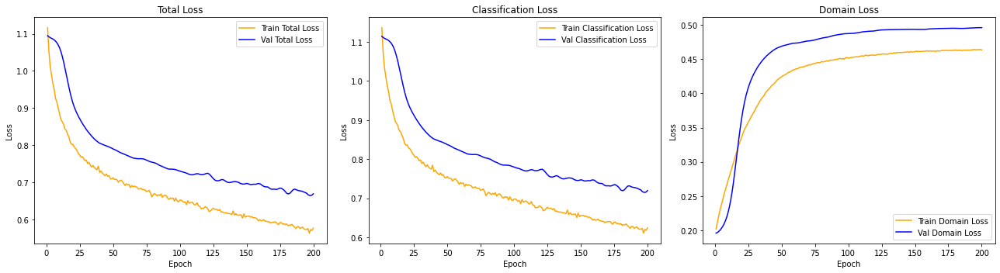

In [95]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt

# === Seed ===
torch.manual_seed(42)
np.random.seed(42)

# === Load data ===
x = np.load("training_features_mean.npy")
y = np.load("training_labels.npy")
d = np.load("training_devices.npy", allow_pickle=True)

x_test = np.load("test_features_mean.npy")
y_test = np.load("test_labels.npy")
d_test = np.load("test_devices.npy", allow_pickle=True)

# === Preprocessing ===
scaler = StandardScaler()
x = scaler.fit_transform(x)
x_test = scaler.transform(x_test)

le_class = LabelEncoder()
y_enc = le_class.fit_transform(y)
y_test_enc = le_class.transform(y_test)
n_classes = len(np.unique(y_enc))

le_domain = LabelEncoder()
d_enc = le_domain.fit_transform(d)
d_test_enc = le_domain.transform(d_test)
n_domains = len(np.unique(d_enc))

def to_onehot(y, num_classes):
    return F.one_hot(torch.tensor(y, dtype=torch.long), num_classes=num_classes).float()

# === GRL ===
class GradientReversal(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)
    @staticmethod
    def backward(ctx, grad_output):
        return -ctx.alpha * grad_output, None

def revgrad(x, alpha):
    return GradientReversal.apply(x, alpha)

# === Modules ===
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim, bottleneck=128):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, bottleneck),
            nn.BatchNorm1d(bottleneck),
            nn.ReLU()
        )
    def forward(self, x):
        return self.model(x)

class LabelClassifier(nn.Module):
    def __init__(self, bottleneck, num_classes):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(bottleneck, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Linear(64, num_classes)
        )
    def forward(self, x):
        return self.model(x)

class DomainClassifier(nn.Module):
    def __init__(self, bottleneck, num_domains):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(bottleneck, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Linear(64, num_domains)
        )
    def forward(self, x, alpha):
        x = revgrad(x, alpha)
        return self.model(x)

# === Tensors ===
X_train_tensor = torch.tensor(x, dtype=torch.float32)
y_train_tensor = torch.tensor(y_enc, dtype=torch.long)
d_train_onehot = to_onehot(d_enc, n_domains)

X_test_tensor = torch.tensor(x_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_enc, dtype=torch.long)
d_test_onehot = to_onehot(d_test_enc, n_domains)

# === Models ===
input_dim = x.shape[1]
bottleneck_dim = 256
lambda_domain = 0.1

G = FeatureExtractor(input_dim, bottleneck=bottleneck_dim)
C = LabelClassifier(bottleneck=bottleneck_dim, num_classes=n_classes)
D = DomainClassifier(bottleneck=bottleneck_dim, num_domains=n_domains)

params = list(G.parameters()) + list(C.parameters()) + list(D.parameters())
optimizer = torch.optim.Adam(params, lr=1e-3)

loss_class = nn.CrossEntropyLoss()
loss_domain = nn.MSELoss()

# === Track Losses ===
train_total_losses = []
train_class_losses = []
train_domain_losses = []
val_total_losses = []
val_class_losses = []
val_domain_losses = []

# === Training ===
print(f"Training DANN with λ={lambda_domain} and explonentially increasing alpha from 0 to 1 ...")
epochs = 200
for epoch in range(epochs):
    G.train(); C.train(); D.train()

    p = epoch / epochs
    alpha = 2. / (1. + np.exp(-10 * p)) - 1

    feats = G(X_train_tensor)
    class_logits = C(feats)
    domain_logits = D(feats, alpha=alpha)

    loss_c = loss_class(class_logits, y_train_tensor)
    loss_d = loss_domain(F.softmax(domain_logits, dim=1), d_train_onehot)
    total_loss = loss_c - lambda_domain * loss_d

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    train_total_losses.append(total_loss.item())
    train_class_losses.append(loss_c.item())
    train_domain_losses.append(loss_d.item())

    # Validation
    G.eval(); C.eval(); D.eval()
    with torch.no_grad():
        feats_val = G(X_test_tensor)
        class_logits_val = C(feats_val)
        domain_logits_val = D(feats_val, alpha=alpha)

        val_loss_c = loss_class(class_logits_val, y_test_tensor)
        val_loss_d = loss_domain(F.softmax(domain_logits_val, dim=1), d_test_onehot)
        val_total = val_loss_c - lambda_domain * val_loss_d

    val_total_losses.append(val_total.item())
    val_class_losses.append(val_loss_c.item())
    val_domain_losses.append(val_loss_d.item())

    if epoch == 0 or total_loss.item() < min_loss:
        min_loss = total_loss.item()
        torch.save(G.state_dict(), "best_G.pth")
        torch.save(C.state_dict(), "best_C.pth")

# === Save embeddings ===
G.eval()
with torch.no_grad():
    emb_train = G(X_train_tensor).cpu().numpy()
    emb_test = G(X_test_tensor).cpu().numpy()

np.save("dann_training_embeddings.npy", emb_train)
np.save("dann_test_embeddings.npy", emb_test)

# === Plot Losses ===
epochs_range = range(1, epochs + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_total_losses, label='Train Total Loss', color='orange')
plt.plot(epochs_range, val_total_losses, label='Val Total Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Total Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(epochs_range, train_class_losses, label='Train Classification Loss', color='orange')
plt.plot(epochs_range, val_class_losses, label='Val Classification Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Classification Loss')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(epochs_range, train_domain_losses, label='Train Domain Loss', color='orange')
plt.plot(epochs_range, val_domain_losses, label='Val Domain Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Domain Loss')
plt.legend()

plt.tight_layout()
plt.show()

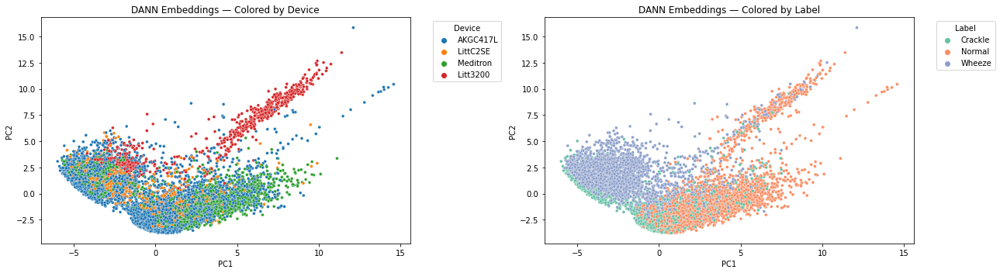

In [98]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

emb_train = np.load("dann_training_embeddings.npy")
emb_test = np.load("dann_test_embeddings.npy")

y_train = np.load("training_labels.npy", allow_pickle=True)
y_test = np.load("test_labels.npy", allow_pickle=True)
d_train = np.load("training_devices.npy", allow_pickle=True)
d_test = np.load("test_devices.npy", allow_pickle=True)

embeddings = np.vstack([emb_train, emb_test])
labels = np.concatenate([y_train, y_test])
devices = np.concatenate([d_train, d_test])

le_label = LabelEncoder()
labels_enc = le_label.fit_transform(labels)

le_device = LabelEncoder()
devices_enc = le_device.fit_transform(devices)

pca = PCA(n_components=2)
emb_pca = pca.fit_transform(embeddings)

plt.figure(figsize=(18, 5))

plt.subplot(1, 2, 1)
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1],
                hue=le_device.inverse_transform(devices_enc),
                palette='tab10', s=15)
plt.title("DANN Embeddings — Colored by Device")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Device", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(1, 2, 2)
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1],
                hue=le_label.inverse_transform(labels_enc),
                palette='Set2', s=15)
plt.title("DANN Embeddings — Colored by Label")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Label", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [101]:
#Evaluate Domain Classifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

G.eval()
D.eval()

with torch.no_grad():
    # Extract domain logits (without GRL = alpha=0)
    feats_train = G(X_train_tensor)
    domain_logits_train = D(feats_train, alpha=0)
    domain_preds_train = torch.argmax(domain_logits_train, dim=1).cpu().numpy()

    feats_test = G(X_test_tensor)
    domain_logits_test = D(feats_test, alpha=0)
    domain_preds_test = torch.argmax(domain_logits_test, dim=1).cpu().numpy()

# Metrics
print("DANN Domain Classifier Evaluation on Training Set")
print("Confusion Matrix:\n", confusion_matrix(d_enc, domain_preds_train))
print("Accuracy:", accuracy_score(d_enc, domain_preds_train))

DANN Domain Classifier Evaluation on Training Set
Confusion Matrix:
 [[   0 3178   39 2367]
 [   0    4  361  293]
 [   0  453    4  380]
 [   0 1114    3  543]]
Accuracy: 0.06305069229889003


#### **Conditional DANN**

| Train Devices      | Test Device | Accuracy | Macro F1 | Macro AUC | Macro F1 Increase / Drop (%)|
| ------------------ | ----------- | -------- | -------- | --- | --- |
| All  | Meditron    | 0.81        | 0.81        | 0.87    | + 1.3 %   |
| All  | AKGC417L    | 0.76        | 0.76        | 0.85   | + 4.1 % |
| All  | Litt3200    | 0.79        | 0.76        | 0.78   | - 3.8 % |
| All  | LittC2SE    | 0.75        | 0.75        | 0.80   | - 3.8 % |
| All  | All    | 0.77        | 0.77        | 0.86   | + 5.5 % |

Training Conditional DANN with λ=0.2 and exponentailly increasing alpha value from 0 to 1:


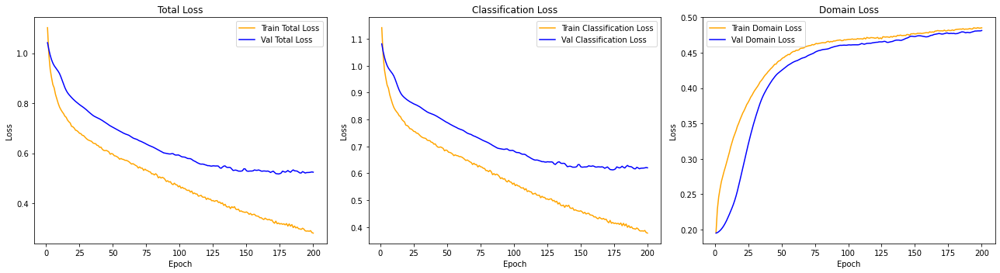

In [104]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
import matplotlib.pyplot as plt

# === Seed ===
torch.manual_seed(42)
np.random.seed(42)

# === Load data ===
x = np.load("training_features_mean.npy")
y = np.load("training_labels.npy")
d = np.load("training_devices.npy", allow_pickle=True)

x_test = np.load("test_features_mean.npy")
y_test = np.load("test_labels.npy")
d_test = np.load("test_devices.npy", allow_pickle=True)

# === Preprocessing ===
scaler = StandardScaler()
x = scaler.fit_transform(x)
x_test = scaler.transform(x_test)

le_class = LabelEncoder()
y_enc = le_class.fit_transform(y)
y_test_enc = le_class.transform(y_test)
n_classes = len(np.unique(y_enc))

le_domain = LabelEncoder()
d_enc = le_domain.fit_transform(d)
d_test_enc = le_domain.transform(d_test)
n_domains = len(np.unique(d_enc))

def to_onehot(y, num_classes):
    return F.one_hot(torch.tensor(y, dtype=torch.long), num_classes=num_classes).float()

# === GRL ===
class GradientReversal(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)
    @staticmethod
    def backward(ctx, grad_output):
        return -ctx.alpha * grad_output, None

def grad_reverse(x, alpha):
    return GradientReversal.apply(x, alpha)

# === CDAN Feature × Prediction ===
def conditional_map(f, y_soft):
    return torch.bmm(y_soft.unsqueeze(2), f.unsqueeze(1)).view(f.size(0), -1)

# === Networks ===
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim, bottleneck=256):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, bottleneck),
            nn.BatchNorm1d(bottleneck),
            nn.ReLU()
        )
    def forward(self, x):
        return self.net(x)

class LabelClassifier(nn.Module):
    def __init__(self, bottleneck, num_classes):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(bottleneck, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes)
        )
    def forward(self, x):
        return self.net(x)

class DomainDiscriminator(nn.Module):
    def __init__(self, input_dim, num_domains):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Linear(64, num_domains)
        )
    def forward(self, x):
        return self.net(x)

# === Init ===
input_dim = x.shape[1]
bottleneck_dim = 256
lambda_domain = 0.2

X_train = torch.tensor(x, dtype=torch.float32)
y_train = torch.tensor(y_enc, dtype=torch.long)
d_train_onehot = to_onehot(d_enc, n_domains)

X_test = torch.tensor(x_test, dtype=torch.float32)
y_test = torch.tensor(y_test_enc, dtype=torch.long)
d_test_onehot = to_onehot(d_test_enc, n_domains)

G = FeatureExtractor(input_dim, bottleneck=bottleneck_dim)
C = LabelClassifier(bottleneck=bottleneck_dim, num_classes=n_classes)
D = DomainDiscriminator(input_dim=bottleneck_dim * n_classes, num_domains=n_domains)

optimizer = torch.optim.Adam(list(G.parameters()) + list(C.parameters()) + list(D.parameters()), lr=1e-3)
loss_class = nn.CrossEntropyLoss()
loss_domain = nn.MSELoss()

train_total_losses, train_class_losses, train_domain_losses = [], [], []
val_total_losses, val_class_losses, val_domain_losses = [], [], []

# === Training ===
print(f"Training Conditional DANN with λ={lambda_domain} and exponentailly increasing alpha value from 0 to 1:")
epochs = 200
min_loss = float("inf")

for epoch in range(epochs):
    G.train(); C.train(); D.train()

    p = epoch / epochs
    alpha = 2. / (1. + np.exp(-10 * p)) - 1

    feat = G(X_train)
    logits = C(feat)
    y_soft = F.softmax(logits, dim=1)

    cond_feat = conditional_map(feat, y_soft)
    cond_feat = grad_reverse(cond_feat, alpha)
    domain_logits = D(cond_feat)

    loss_c = loss_class(logits, y_train)
    loss_d = loss_domain(F.softmax(domain_logits, dim=1), d_train_onehot)
    total_loss = loss_c - lambda_domain * loss_d

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    train_total_losses.append(total_loss.item())
    train_class_losses.append(loss_c.item())
    train_domain_losses.append(loss_d.item())

    # === Validation ===
    G.eval(); C.eval(); D.eval()
    with torch.no_grad():
        feat_val = G(X_test)
        logits_val = C(feat_val)
        y_val_soft = F.softmax(logits_val, dim=1)

        cond_feat_val = conditional_map(feat_val, y_val_soft)
        cond_feat_val = grad_reverse(cond_feat_val, alpha)
        domain_logits_val = D(cond_feat_val)

        loss_c_val = loss_class(logits_val, y_test)
        loss_d_val = loss_domain(F.softmax(domain_logits_val, dim=1), d_test_onehot)
        val_total = loss_c_val - lambda_domain * loss_d_val

    val_total_losses.append(val_total.item())
    val_class_losses.append(loss_c_val.item())
    val_domain_losses.append(loss_d_val.item())

    if epoch == 0 or total_loss.item() < min_loss:
        min_loss = total_loss.item()
        torch.save(G.state_dict(), "best_G.pth")
        torch.save(C.state_dict(), "best_C.pth")

# === Save embeddings ===
G.eval()
with torch.no_grad():
    emb_train = G(X_train).cpu().numpy()
    emb_test = G(X_test).cpu().numpy()
np.save("cdan_embeddings_train.npy", emb_train)
np.save("cdan_embeddings_test.npy", emb_test)

# === Plot Losses ===
epochs_range = range(1, epochs + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_total_losses, label='Train Total Loss', color='orange')
plt.plot(epochs_range, val_total_losses, label='Val Total Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Total Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(epochs_range, train_class_losses, label='Train Classification Loss', color='orange')
plt.plot(epochs_range, val_class_losses, label='Val Classification Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Classification Loss')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(epochs_range, train_domain_losses, label='Train Domain Loss', color='orange')
plt.plot(epochs_range, val_domain_losses, label='Val Domain Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Domain Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [106]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Domain Classifier Evaluation
G.eval()
C.eval()
D.eval()

with torch.no_grad():
    # Train set
    feat_train = G(X_train)
    y_train_soft = F.softmax(C(feat_train), dim=1)
    cond_feat_train = conditional_map(feat_train, y_train_soft)
    domain_logits_train = D(cond_feat_train)
    domain_preds_train = torch.argmax(domain_logits_train, dim=1).cpu().numpy()

# === Metrics ===
print("Conditional DANN Domain Classifier Evaluation on Training Set")
print("Confusion Matrix:\n", confusion_matrix(d_enc, domain_preds_train))
print("Accuracy:", accuracy_score(d_enc, domain_preds_train))

Conditional DANN Domain Classifier Evaluation on Training Set
Confusion Matrix:
 [[   1 2682 1275 1626]
 [ 648    1    1    8]
 [  41  449   41  306]
 [  20  648  975   17]]
Accuracy: 0.006865774116031583


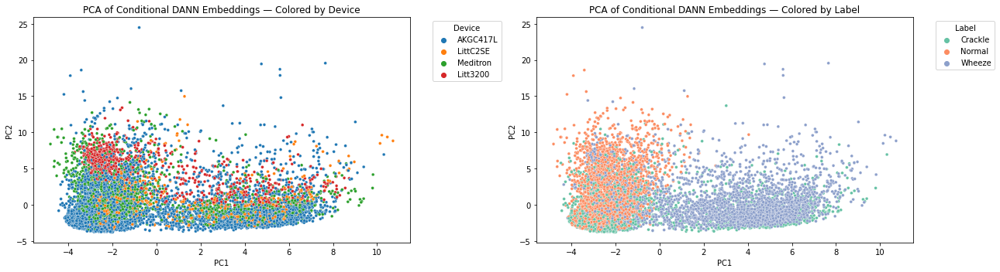

In [91]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

# === Load CDAN embeddings and labels/domains ===
emb_train = np.load("cdan_embeddings_train.npy")
emb_test = np.load("cdan_embeddings_test.npy")

y_train = np.load("training_labels.npy", allow_pickle=True)
y_test = np.load("test_labels.npy", allow_pickle=True)
d_train = np.load("training_devices.npy", allow_pickle=True)
d_test = np.load("test_devices.npy", allow_pickle=True)

# === Concatenate train/test
embeddings = np.vstack([emb_train, emb_test])
labels = np.concatenate([y_train, y_test])
devices = np.concatenate([d_train, d_test])

# === Encode labels and domains
le_label = LabelEncoder()
labels_enc = le_label.fit_transform(labels)

le_device = LabelEncoder()
devices_enc = le_device.fit_transform(devices)

# === PCA
pca = PCA(n_components=2)
emb_pca = pca.fit_transform(embeddings)

# === Plot: PCA colored by DEVICE ===
plt.figure(figsize=(18, 5))

plt.subplot(1, 2, 1)
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1],
                hue=le_device.inverse_transform(devices_enc),
                palette='tab10', s=15)
plt.title("PCA of Conditional DANN Embeddings — Colored by Device")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Device", bbox_to_anchor=(1.05, 1), loc='upper left')

# === Plot: PCA colored by LABEL ===
plt.subplot(1, 2, 2)
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1],
                hue=le_label.inverse_transform(labels_enc),
                palette='Set2', s=15)
plt.title("PCA of Conditional DANN Embeddings — Colored by Label")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Label", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


#### **DAVAE**

Baseline for Supervised Domain Adaptation:

| Train Devices      | Test Device | Accuracy | Macro F1 | Macro AUC |
| ------------------ | ----------- | -------- | -------- | --- |
| All | Meditron    | 0.80        | 0.80        | 0.84   |
| All | AKGC417L    | 0.72        | 0.72        | 0.82   |
| All | Litt3200    | 0.81        | 0.79        | 0.81   |
| All | LittC2SE    | 0.67        | 0.70        | 0.76   |
| All | All    | 0.73        | 0.73        | 0.83   |

Supervised DAVAE (1 phase):

| Train Devices      | Test Device | Accuracy | Macro F1 | Macro AUC | Macro F1 Increase / Drop (%)|
| ------------------ | ----------- | -------- | -------- | --- | --- |
| All  | Meditron    | 0.82        | 0.83        | 0.89    | + 3.8 %   |
| All  | AKGC417L    | 0.73        | 0.73        | 0.82   | + 1.4 % |
| All  | Litt3200    | 0.80        | 0.79        | 0.81   | - |
| All  | LittC2SE    | 0.77        | 0.78        | 0.79   | + 11.4 % |
| All  | All    | 0.76        | 0.76        | 0.83   | + 4.1 % |

1 Phase training

In [87]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from torch.autograd import Function
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder

# CONFIG
latent_dim = 16
num_domains = 4
num_classes = 3
batch_size = 64
epochs = 100
initial_lambda = 0.0
final_lambda = 1.0
beta = 0.1       # KL loss weight
gamma = 1.0      # Domain loss weight
class_weight = 2.0  # Increased weight on class loss
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# GRL
class GRL(Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        return -ctx.lambda_ * grad_output, None

# Modules
class Encoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

    def forward(self, x):
        h = self.fc(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z, mu, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim, input_dim):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim)
        )

    def forward(self, z):
        return self.fc(z)

class DomainClassifier(nn.Module):
    def __init__(self, latent_dim, num_domains):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.1),  # Reduced dropout
            nn.Linear(64, num_domains)
        )

    def forward(self, z, lambda_):
        z = GRL.apply(z, lambda_)
        return self.fc(z)

class LabelClassifier(nn.Module):
    def __init__(self, latent_dim, num_classes):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )

    def forward(self, z):
        return self.fc(z)

# Loss VAE
def vae_loss(x_recon, x, mu, logvar):
    recon_loss = nn.MSELoss()(x_recon, x)
    kl = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss, kl

X_train = np.load("training_features_mean.npy")
d_train = np.load("training_devices.npy")
y_train = np.load("training_labels.npy")
X_test = np.load("test_features_mean.npy")
d_test = np.load("test_devices.npy")
y_test = np.load("test_labels.npy")

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

device_encoder = LabelEncoder()
d_train = device_encoder.fit_transform(d_train)
d_test = device_encoder.transform(d_test)

label_encoder = LabelEncoder()
y_train_enc = label_encoder.fit_transform(y_train)
y_test_enc = label_encoder.transform(y_test)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
d_train_tensor = torch.tensor(d_train, dtype=torch.long)
y_train_tensor = torch.tensor(y_train_enc, dtype=torch.long)
train_dataset = TensorDataset(X_train_tensor, d_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Init modules
input_dim = X_train.shape[1]
encoder = Encoder(input_dim, latent_dim).to(device)
decoder = Decoder(latent_dim, input_dim).to(device)
domain_clf = DomainClassifier(latent_dim, num_domains).to(device)
label_clf = LabelClassifier(latent_dim, num_classes).to(device)

optimizer = torch.optim.Adam(
    list(encoder.parameters()) +
    list(decoder.parameters()) +
    list(domain_clf.parameters()) +
    list(label_clf.parameters()),
    lr=1e-3
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

for epoch in range(epochs):
    encoder.train()
    decoder.train()
    domain_clf.train()
    label_clf.train()

    total_recon, total_kl, total_dom, total_cls = 0, 0, 0, 0
    p = epoch / epochs
    lambda_val = 2. / (1. + np.exp(-10 * p)) - 1  # smoother schedule

    for xb, db, yb in train_loader:
        xb, db, yb = xb.to(device), db.to(device), yb.to(device)

        z, mu, logvar = encoder(xb)
        x_recon = decoder(z)
        domain_logits = domain_clf(z, lambda_val)
        class_logits = label_clf(z)

        recon, kl = vae_loss(x_recon, xb, mu, logvar)
        loss_dom = nn.CrossEntropyLoss()(domain_logits, db)
        loss_cls = nn.CrossEntropyLoss()(class_logits, yb)
        total_loss = recon + beta * kl + gamma * loss_dom + class_weight * loss_cls

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        total_recon += recon.item()
        total_kl += kl.item()
        total_dom += loss_dom.item()
        total_cls += loss_cls.item()

    scheduler.step()
    print(f"Epoch {epoch+1}/{epochs} | Recon: {total_recon:.4f} | KL: {total_kl:.4f} | Domain: {total_dom:.4f} | Class: {total_cls:.4f} | λ: {lambda_val:.2f}")

#Extract embeddings
def extract_embeddings(X, batch_size=256):
    encoder.eval()
    all_z = []
    with torch.no_grad():
        for i in range(0, len(X), batch_size):
            x_batch = torch.tensor(X[i:i+batch_size], dtype=torch.float32).to(device)
            z, _, _ = encoder(x_batch)
            all_z.append(z.cpu())
    return torch.cat(all_z, dim=0).numpy()

emb_train = extract_embeddings(X_train)
emb_test = extract_embeddings(X_test)

np.save("davae_embeddings_train_2.npy", emb_train)
np.save("davae_embeddings_test_2.npy", emb_test)

Epoch 1/100 | Recon: 50.8781 | KL: 127.9666 | Domain: 124.5051 | Class: 125.1924 | λ: 0.00
Epoch 2/100 | Recon: 24.3537 | KL: 161.7519 | Domain: 96.0911 | Class: 106.7578 | λ: 0.05
Epoch 3/100 | Recon: 19.5448 | KL: 167.5598 | Domain: 90.7364 | Class: 100.4197 | λ: 0.10
Epoch 4/100 | Recon: 16.8453 | KL: 172.4668 | Domain: 93.2932 | Class: 96.4216 | λ: 0.15
Epoch 5/100 | Recon: 15.6794 | KL: 174.7646 | Domain: 95.5746 | Class: 94.0297 | λ: 0.20
Epoch 6/100 | Recon: 16.0076 | KL: 178.2827 | Domain: 102.9330 | Class: 91.3884 | λ: 0.24
Epoch 7/100 | Recon: 20.3997 | KL: 212.9414 | Domain: 146.8589 | Class: 89.9133 | λ: 0.29
Epoch 8/100 | Recon: 18.2399 | KL: 205.4897 | Domain: 131.7094 | Class: 87.6518 | λ: 0.34
Epoch 9/100 | Recon: 17.0958 | KL: 196.0478 | Domain: 118.3380 | Class: 83.5429 | λ: 0.38
Epoch 10/100 | Recon: 17.4227 | KL: 204.6375 | Domain: 129.3273 | Class: 82.2372 | λ: 0.42
Epoch 11/100 | Recon: 17.4525 | KL: 209.4746 | Domain: 127.9120 | Class: 79.1389 | λ: 0.46
Epoch 12/

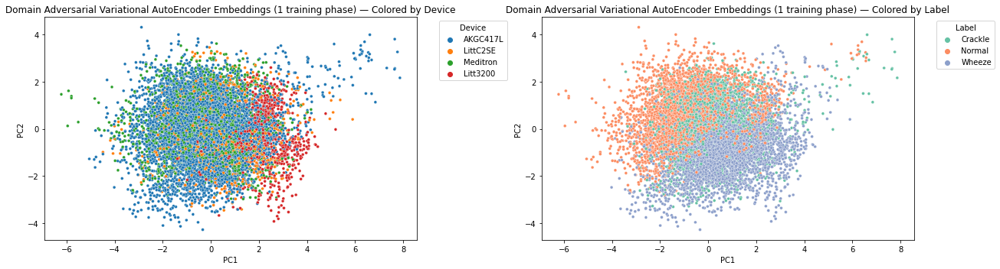

In [89]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

# === Load CDAN embeddings and labels/domains ===
emb_train = np.load("davae_embeddings_train_2.npy")
emb_test = np.load("davae_embeddings_test_2.npy")

y_train = np.load("training_labels.npy", allow_pickle=True)
y_test = np.load("test_labels.npy", allow_pickle=True)
d_train = np.load("training_devices.npy", allow_pickle=True)
d_test = np.load("test_devices.npy", allow_pickle=True)

embeddings = np.vstack([emb_train, emb_test])
labels = np.concatenate([y_train, y_test])
devices = np.concatenate([d_train, d_test])

le_label = LabelEncoder()
labels_enc = le_label.fit_transform(labels)

le_device = LabelEncoder()
devices_enc = le_device.fit_transform(devices)

pca = PCA(n_components=2)
emb_pca = pca.fit_transform(embeddings)

plt.figure(figsize=(18, 5))

plt.subplot(1, 2, 1)
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1],
                hue=le_device.inverse_transform(devices_enc),
                palette='tab10', s=15)
plt.title("Domain Adversarial Variational AutoEncoder Embeddings (1 training phase) — Colored by Device")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Device", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(1, 2, 2)
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1],
                hue=le_label.inverse_transform(labels_enc),
                palette='Set2', s=15)
plt.title("Domain Adversarial Variational AutoEncoder Embeddings (1 training phase) — Colored by Label")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Label", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

2 phase training

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from torch.autograd import Function
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder

# CONFIGS
latent_dim = 16
num_domains = 4
num_classes = 3
batch_size = 64
epochs = 100
vae_stage_epochs = 30  # number of epochs to train VAE alone
initial_lambda = 0.0
final_lambda = 1.0
beta = 0.1       # KL loss weight
gamma = 1.0      # Domain loss weight
class_weight = 2.0  # Increased weight on class loss
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# GRL 
class GRL(Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        return -ctx.lambda_ * grad_output, None

# Modules
class Encoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

    def forward(self, x):
        h = self.fc(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z, mu, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim, input_dim):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim)
        )

    def forward(self, z):
        return self.fc(z)

class DomainClassifier(nn.Module):
    def __init__(self, latent_dim, num_domains):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(64, num_domains)
        )

    def forward(self, z, lambda_):
        z = GRL.apply(z, lambda_)
        return self.fc(z)

class LabelClassifier(nn.Module):
    def __init__(self, latent_dim, num_classes):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )

    def forward(self, z):
        return self.fc(z)

# Loss VAE
def vae_loss(x_recon, x, mu, logvar):
    recon_loss = nn.MSELoss()(x_recon, x)
    kl = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss, kl

X_train = np.load("training_features_mean.npy")
d_train = np.load("training_devices.npy")
y_train = np.load("training_labels.npy")
X_test = np.load("test_features_mean.npy")
d_test = np.load("test_devices.npy")
y_test = np.load("test_labels.npy")

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

device_encoder = LabelEncoder()
d_train = device_encoder.fit_transform(d_train)
d_test = device_encoder.transform(d_test)

label_encoder = LabelEncoder()
y_train_enc = label_encoder.fit_transform(y_train)
y_test_enc = label_encoder.transform(y_test)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
d_train_tensor = torch.tensor(d_train, dtype=torch.long)
y_train_tensor = torch.tensor(y_train_enc, dtype=torch.long)
train_dataset = TensorDataset(X_train_tensor, d_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# ------------------ INIT MODELS ------------------
input_dim = X_train.shape[1]
encoder = Encoder(input_dim, latent_dim).to(device)
decoder = Decoder(latent_dim, input_dim).to(device)
domain_clf = DomainClassifier(latent_dim, num_domains).to(device)
label_clf = LabelClassifier(latent_dim, num_classes).to(device)

optimizer = torch.optim.Adam(
    list(encoder.parameters()) +
    list(decoder.parameters()) +
    list(domain_clf.parameters()) +
    list(label_clf.parameters()),
    lr=1e-3
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

# STAGE 1: VAE PRETRAINING
print("Stage 1: Pre-training of VAE ...")
for epoch in range(vae_stage_epochs):
    encoder.train()
    decoder.train()
    total_recon, total_kl = 0, 0

    for xb, _, _ in train_loader:
        xb = xb.to(device)
        z, mu, logvar = encoder(xb)
        x_recon = decoder(z)
        recon, kl = vae_loss(x_recon, xb, mu, logvar)
        loss = recon + beta * kl

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_recon += recon.item()
        total_kl += kl.item()

    print(f"[VAE Stage] Epoch {epoch+1}/{vae_stage_epochs} | Recon: {total_recon:.4f} | KL: {total_kl:.4f}")

# STAGE 2: DANN TRAINING
decoder.eval()
for param in decoder.parameters():
    param.requires_grad = False

print("Stage 2: Training of DANN using the pre-trained VAE ...")
for epoch in range(vae_stage_epochs, epochs):
    encoder.train()
    domain_clf.train()
    label_clf.train()

    total_dom, total_cls = 0, 0
    p = (epoch - vae_stage_epochs) / (epochs - vae_stage_epochs)
    lambda_val = 2. / (1. + np.exp(-10 * p)) - 1

    for xb, db, yb in train_loader:
        xb, db, yb = xb.to(device), db.to(device), yb.to(device)
        z, _, _ = encoder(xb)
        domain_logits = domain_clf(z, lambda_val)
        class_logits = label_clf(z)

        loss_dom = nn.CrossEntropyLoss()(domain_logits, db)
        loss_cls = nn.CrossEntropyLoss()(class_logits, yb)
        loss = gamma * loss_dom + class_weight * loss_cls

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_dom += loss_dom.item()
        total_cls += loss_cls.item()

    scheduler.step()
    print(f"[DANN Stage] Epoch {epoch+1}/{epochs} | Domain: {total_dom:.4f} | Class: {total_cls:.4f} | λ: {lambda_val:.2f}")

# Extract embeddings
def extract_embeddings(X, batch_size=256):
    encoder.eval()
    all_z = []
    with torch.no_grad():
        for i in range(0, len(X), batch_size):
            x_batch = torch.tensor(X[i:i+batch_size], dtype=torch.float32).to(device)
            z, _, _ = encoder(x_batch)
            all_z.append(z.cpu())
    return torch.cat(all_z, dim=0).numpy()

emb_train = extract_embeddings(X_train)
emb_test = extract_embeddings(X_test)

np.save("davae_embeddings_train.npy", emb_train)
np.save("davae_embeddings_test.npy", emb_test)

Stage 1: Pre-training of VAE ...
[VAE Stage] Epoch 1/30 | Recon: 39.4569 | KL: 106.3396
[VAE Stage] Epoch 2/30 | Recon: 16.0762 | KL: 124.4858
[VAE Stage] Epoch 3/30 | Recon: 12.3703 | KL: 129.3615
[VAE Stage] Epoch 4/30 | Recon: 10.7457 | KL: 130.8634
[VAE Stage] Epoch 5/30 | Recon: 10.0988 | KL: 131.1206
[VAE Stage] Epoch 6/30 | Recon: 9.5576 | KL: 131.1409
[VAE Stage] Epoch 7/30 | Recon: 9.2686 | KL: 131.4593
[VAE Stage] Epoch 8/30 | Recon: 9.0573 | KL: 130.7222
[VAE Stage] Epoch 9/30 | Recon: 8.9040 | KL: 129.5332
[VAE Stage] Epoch 10/30 | Recon: 8.7873 | KL: 128.7985
[VAE Stage] Epoch 11/30 | Recon: 8.6973 | KL: 128.4267
[VAE Stage] Epoch 12/30 | Recon: 8.6055 | KL: 127.5306
[VAE Stage] Epoch 13/30 | Recon: 8.4721 | KL: 126.8278
[VAE Stage] Epoch 14/30 | Recon: 8.4395 | KL: 125.2886
[VAE Stage] Epoch 15/30 | Recon: 8.3988 | KL: 124.2791
[VAE Stage] Epoch 16/30 | Recon: 8.3495 | KL: 124.3006
[VAE Stage] Epoch 17/30 | Recon: 8.3258 | KL: 123.5665
[VAE Stage] Epoch 18/30 | Recon: 8.3

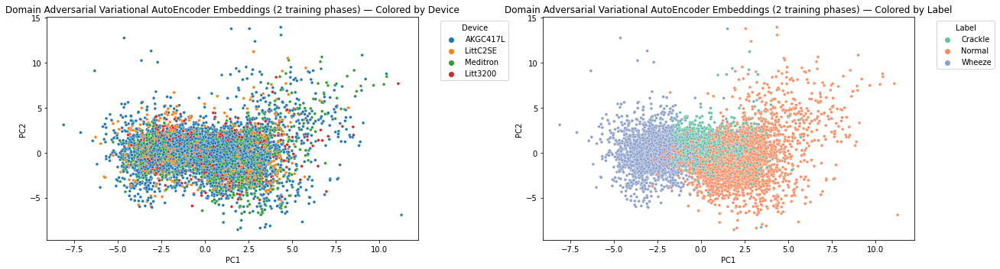

In [90]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

# === Load CDAN embeddings and labels/domains ===
emb_train = np.load("davae_embeddings_train.npy")
emb_test = np.load("davae_embeddings_test.npy")

y_train = np.load("training_labels.npy", allow_pickle=True)
y_test = np.load("test_labels.npy", allow_pickle=True)
d_train = np.load("training_devices.npy", allow_pickle=True)
d_test = np.load("test_devices.npy", allow_pickle=True)

# === Concatenate train/test
embeddings = np.vstack([emb_train, emb_test])
labels = np.concatenate([y_train, y_test])
devices = np.concatenate([d_train, d_test])

# === Encode labels and domains
le_label = LabelEncoder()
labels_enc = le_label.fit_transform(labels)

le_device = LabelEncoder()
devices_enc = le_device.fit_transform(devices)

# === PCA
pca = PCA(n_components=2)
emb_pca = pca.fit_transform(embeddings)

# === Plot: PCA colored by DEVICE ===
plt.figure(figsize=(18, 5))

plt.subplot(1, 2, 1)
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1],
                hue=le_device.inverse_transform(devices_enc),
                palette='tab10', s=15)
plt.title("Domain Adversarial Variational AutoEncoder Embeddings (2 training phases) — Colored by Device")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Device", bbox_to_anchor=(1.05, 1), loc='upper left')

# === Plot: PCA colored by LABEL ===
plt.subplot(1, 2, 2)
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1],
                hue=le_label.inverse_transform(labels_enc),
                palette='Set2', s=15)
plt.title("Domain Adversarial Variational AutoEncoder Embeddings (2 training phases) — Colored by Label")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Label", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

Calculate some distribution distance metrics (Wasserstein, JS) to check how much aligned are the distributions of the corrected features

In [27]:
from utils.metrics import mean_wasserstein

REFERENCE_DEVICE = 'Meditron'
x_before = np.load("training_features_mean.npy")               
x_after = np.load("training_features_sc.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

# Results per device
results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
Wasserstein distance before: 5.7836
Wasserstein distance after:  2.0178
Wasserstein relevant reduction: 65.11%

[LittC2SE → Meditron]
Wasserstein distance before: 9.0538
Wasserstein distance after:  2.3489
Wasserstein relevant reduction: 74.06%

[Litt3200 → Meditron]
Wasserstein distance before: 20.7199
Wasserstein distance after:  2.2785
Wasserstein relevant reduction: 89.00%



In [28]:
from utils.metrics import mean_js_divergence

results_js = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    dist_before = mean_js_divergence(X_src_before, X_trg_before)
    dist_after  = mean_js_divergence(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results_js[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results_js.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"JS divergence before: {vals['before']:.4f}")
    print(f"JS divergence after:  {vals['after']:.4f}")
    print(f"JS relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
JS divergence before: 0.2017
JS divergence after:  0.1222
JS relevant reduction: 39.41%

[LittC2SE → Meditron]
JS divergence before: 0.2485
JS divergence after:  0.1846
JS relevant reduction: 25.68%

[Litt3200 → Meditron]
JS divergence before: 0.4672
JS divergence after:  0.1929
JS relevant reduction: 58.71%



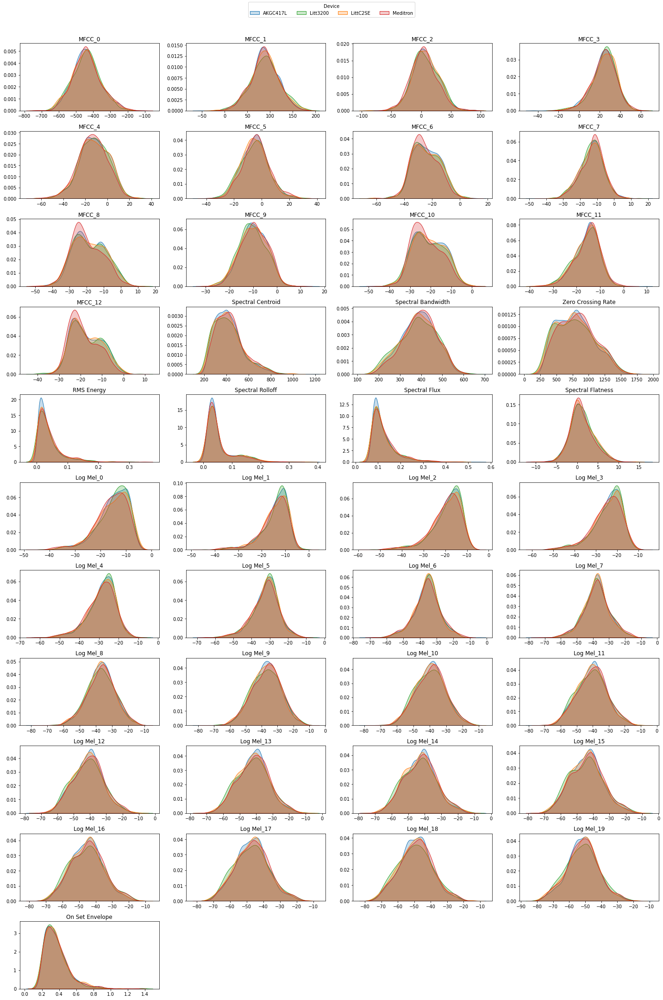

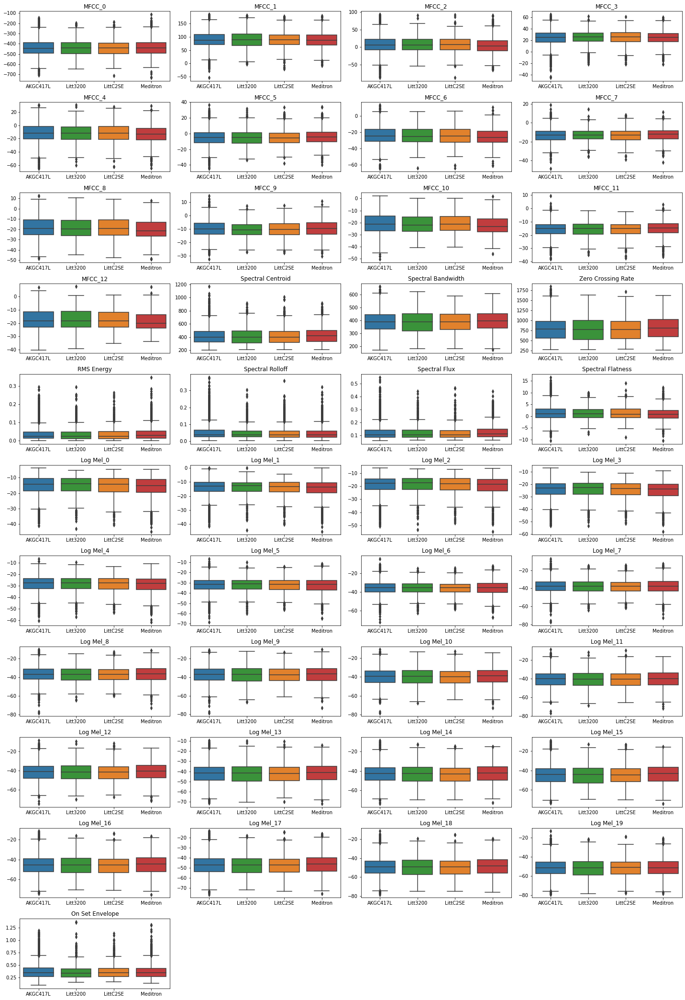

In [34]:
training_features_sc = np.load("training_features_sc.npy")  
training_devices = np.load("training_devices.npy")  

plot_feature_distributions_by_device(training_features_sc, training_devices, FEATURE_NAMES)

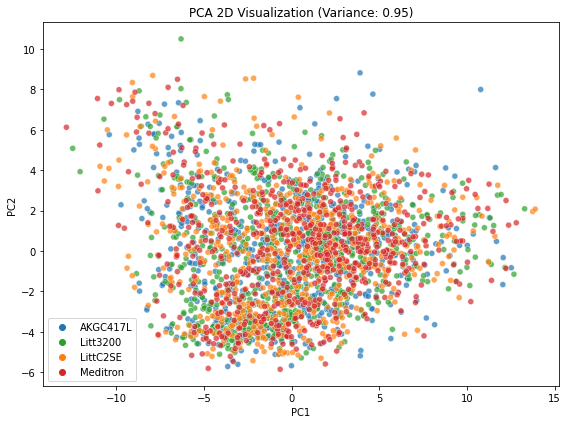

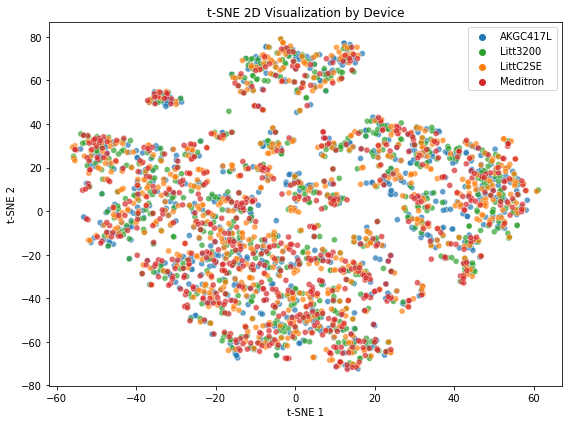

In [ ]:
from utils.plots import perform_pca_and_tsne_by_device

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_sc[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

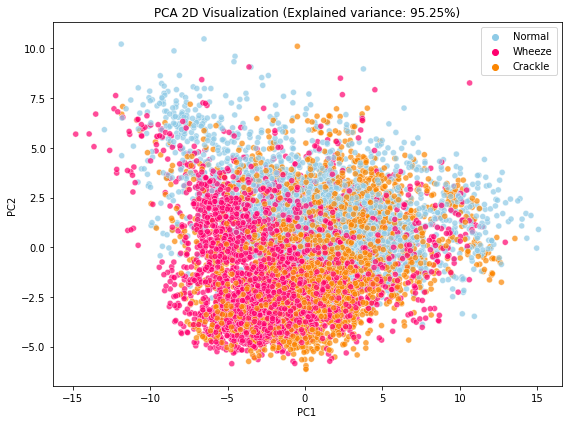

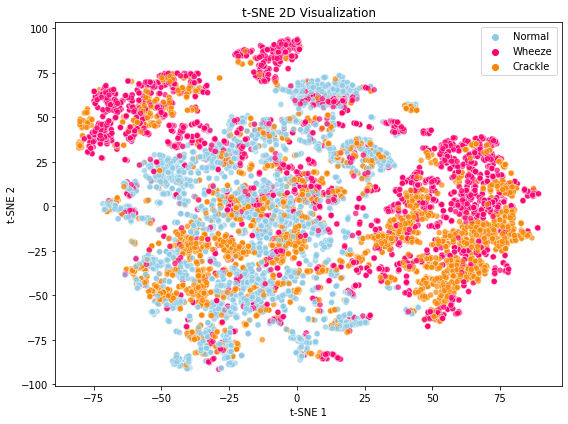

In [32]:
from utils.plots import perform_pca_and_tsne

training_labels_sc = np.load("training_labels_sc.npy")

perform_pca_and_tsne(
    feature_matrix=training_features_sc,  # shape: (cycles, features)
    labels=training_labels_sc,           # shape: (cycles,)
    pca_components=0.95,  # 95% variance
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Accuracy per fold: [0.2595 0.2519 0.2462 0.2178 0.2652]
Mean Domain Classification Accuracy: 0.2481 ± 0.0165


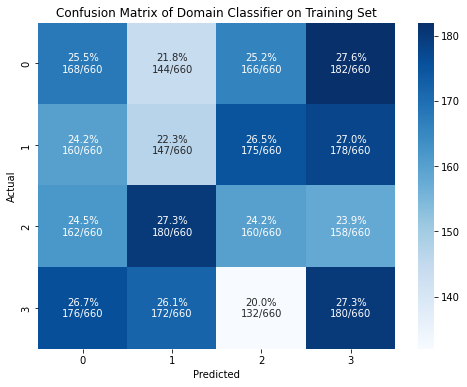

In [33]:
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features_sc[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean Domain Classification Accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()

### **SPECTRUM NORMALIZATION**

In [36]:
from domain_adaptation_algorithms.spectrum_normalization import *

standardizer = ClassWiseSpectralStandardizer(n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

# Prepare data
train_files = [os.path.join(RAW_CYCLE_FOLDER, f) for f in train_df["file"]]
train_labels = train_df["class"].tolist()
train_devices = [next((d for d in DEVICES if d in f), None) for f in train_df["file"]]

# Fit reference class stats of raw data
standardizer.fit(train_files, train_labels, train_devices, reference_device=REFERENCE_DEVICE)

In [38]:
# Apply transform on training set
STANDARDIZED_TRAIN_FOLDER = "corrected_train_standardized"
os.makedirs(STANDARDIZED_TRAIN_FOLDER, exist_ok=True)

for fname, label in tqdm(zip(final_train_df["file"], final_train_df["class"]), total=len(final_train_df), desc="Applying Spectrum Standardization on training set"):
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(STANDARDIZED_TRAIN_FOLDER, fname)

    if not os.path.exists(input_path):
        print(f"[!] Missing: {input_path}")
        continue
    
    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    stft = librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
    phase = np.angle(stft)
    
    norm_spec = standardizer.transform(y, class_name=label)
    y_corrected = standardizer.transform_inverse(norm_spec, phase, len(y))
    
    sf.write(output_path, y_corrected, SAMPLING_RATE)

Applying Spectrum Standardization on training set: 100%|██████████| 8739/8739 [02:47<00:00, 52.25it/s]


In [39]:
# Apply transform on test set
STANDARDIZED_TEST_FOLDER = "corrected_test_standardized"
os.makedirs(STANDARDIZED_TEST_FOLDER, exist_ok=True)

for fname, label in tqdm(zip(test_df["file"], test_df["class"]), total=len(test_df), desc="Applying Spectrum Standardization on test set"):
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(STANDARDIZED_TEST_FOLDER, fname)

    if not os.path.exists(input_path):
        print(f"[!] Missing: {input_path}")
        continue
    
    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    stft = librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
    phase = np.angle(stft)
    
    norm_spec = standardizer.transform(y, class_name=label)
    y_corrected = standardizer.transform_inverse(norm_spec, phase, len(y))
    
    sf.write(output_path, y_corrected, SAMPLING_RATE)

Applying Spectrum Standardization on test set: 100%|██████████| 1279/1279 [00:29<00:00, 42.88it/s]


In [40]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(STANDARDIZED_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected training set"):
    path = os.path.join(STANDARDIZED_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats)
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.stack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

train_features_mean = train_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("training_features_std.npy", train_features_mean)
np.save("training_filenames_std.npy", train_filenames_array)
np.save("training_labels_std.npy", train_labels_array)

Extracting features from corrected training set: 100%|██████████| 8739/8739 [03:42<00:00, 39.32it/s]


In [41]:
# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(STANDARDIZED_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test set"):
    path = os.path.join(STANDARDIZED_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats)
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays
test_features_array = np.stack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

test_features_mean = test_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("test_features_std.npy", test_features_mean)
np.save("test_filenames_std.npy", test_filenames_array)
np.save("test_labels_std.npy", test_labels_array)

Extracting features from corrected test set: 100%|██████████| 1279/1279 [00:32<00:00, 39.48it/s]


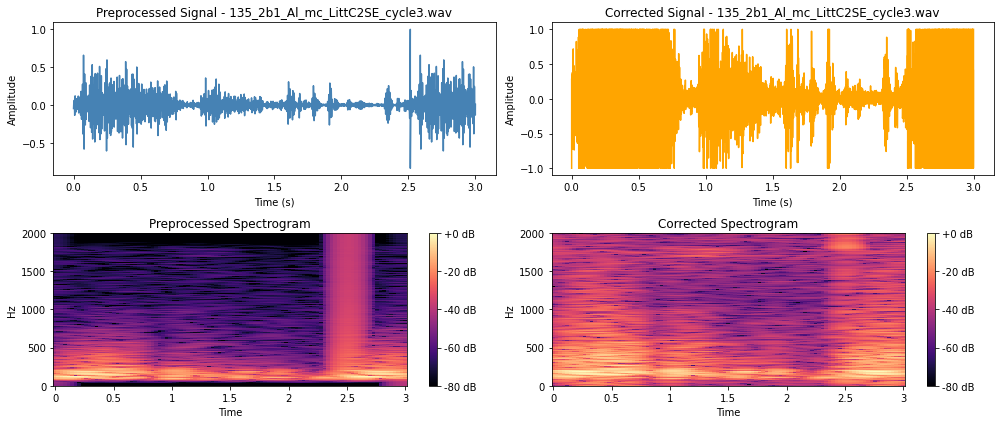

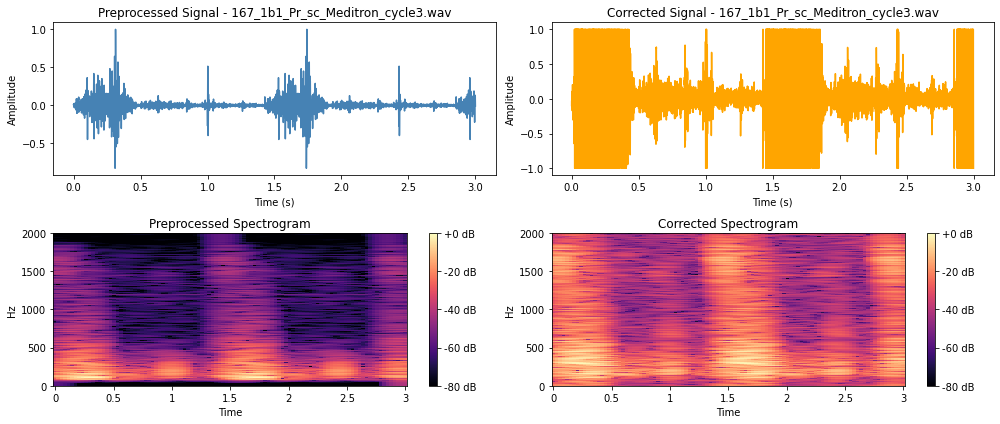

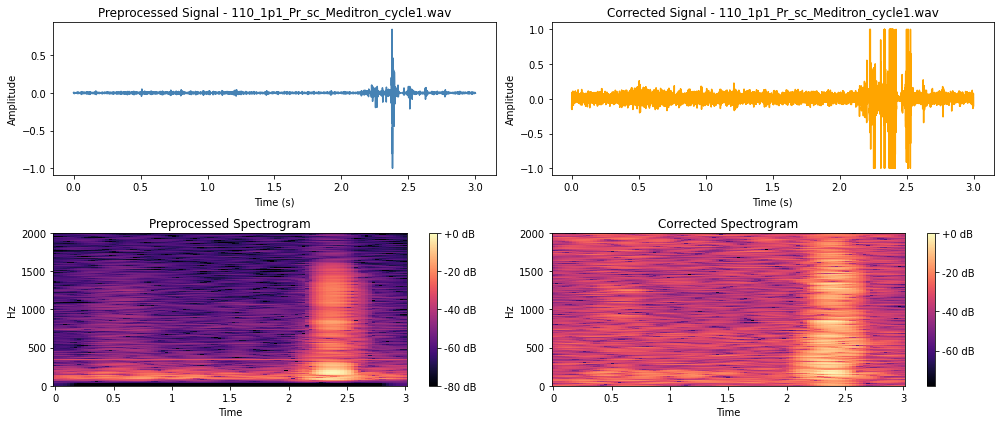

In [42]:
from utils.plots import plot_signals_after_domain_adaptation

# Get the first 3 .wav files that do not originate from the refernece device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains("AKGC417L")]["file"].tolist()[:3]

plot_signals_after_domain_adaptation(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=STANDARDIZED_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

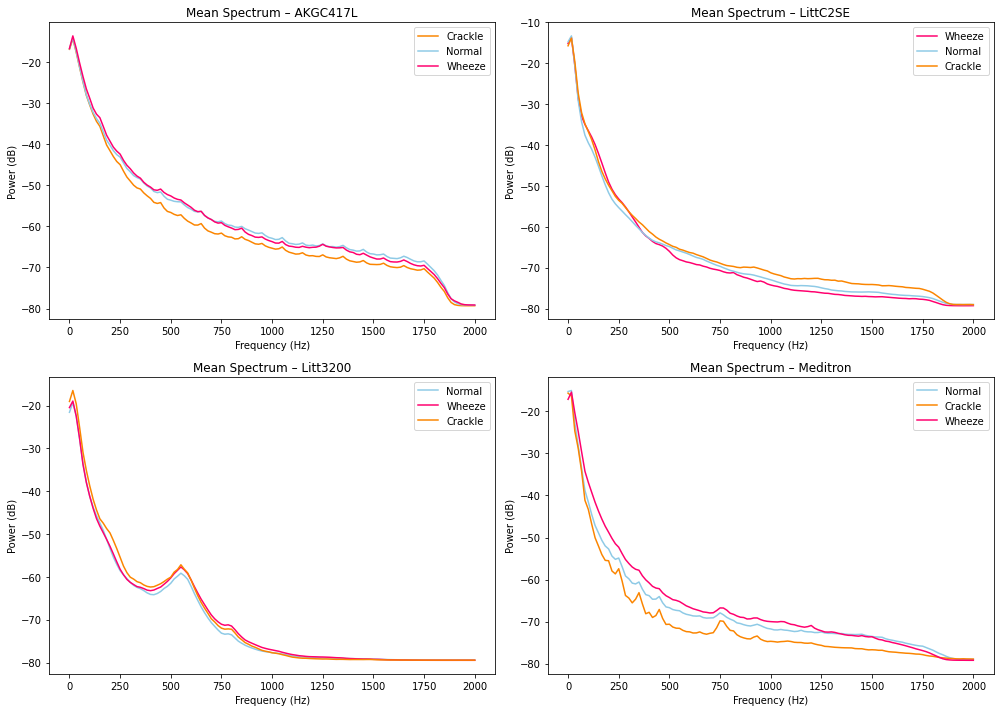

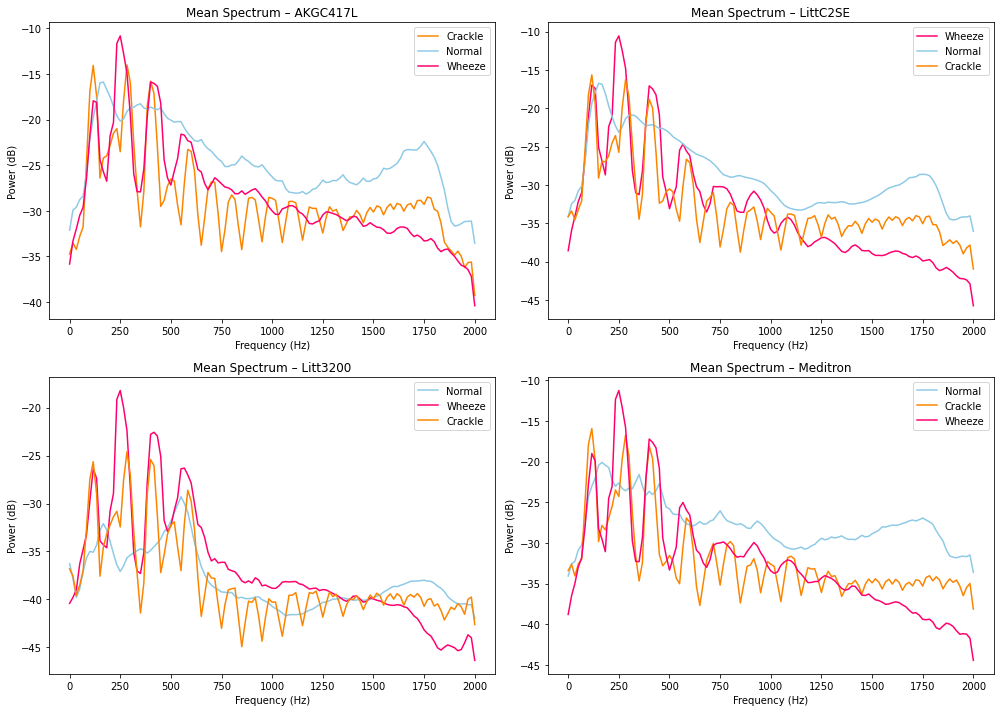

In [43]:
from utils.plots import plot_mean_spectra_per_device

plot_mean_spectra_per_device(
    folder=RAW_CYCLE_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

plot_mean_spectra_per_device(
    folder=STANDARDIZED_TRAIN_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

In [44]:
from utils.metrics import mean_wasserstein

x_before = np.load("training_features_mean.npy")               
x_after = np.load("training_features_std.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

# Results per device
results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
Wasserstein distance before: 5.7836
Wasserstein distance after:  1.8642
Wasserstein relevant reduction: 67.77%

[LittC2SE → Meditron]
Wasserstein distance before: 9.0538
Wasserstein distance after:  1.7857
Wasserstein relevant reduction: 80.28%

[Litt3200 → Meditron]
Wasserstein distance before: 20.7199
Wasserstein distance after:  2.1810
Wasserstein relevant reduction: 89.47%



In [45]:
from utils.metrics import mean_js_divergence

results_js = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    dist_before = mean_js_divergence(X_src_before, X_trg_before)
    dist_after  = mean_js_divergence(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results_js[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results_js.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"JS divergence before: {vals['before']:.4f}")
    print(f"JS divergence after:  {vals['after']:.4f}")
    print(f"JS relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
JS divergence before: 0.2017
JS divergence after:  0.1235
JS relevant reduction: 38.79%

[LittC2SE → Meditron]
JS divergence before: 0.2485
JS divergence after:  0.1903
JS relevant reduction: 23.41%

[Litt3200 → Meditron]
JS divergence before: 0.4672
JS divergence after:  0.1960
JS relevant reduction: 58.05%



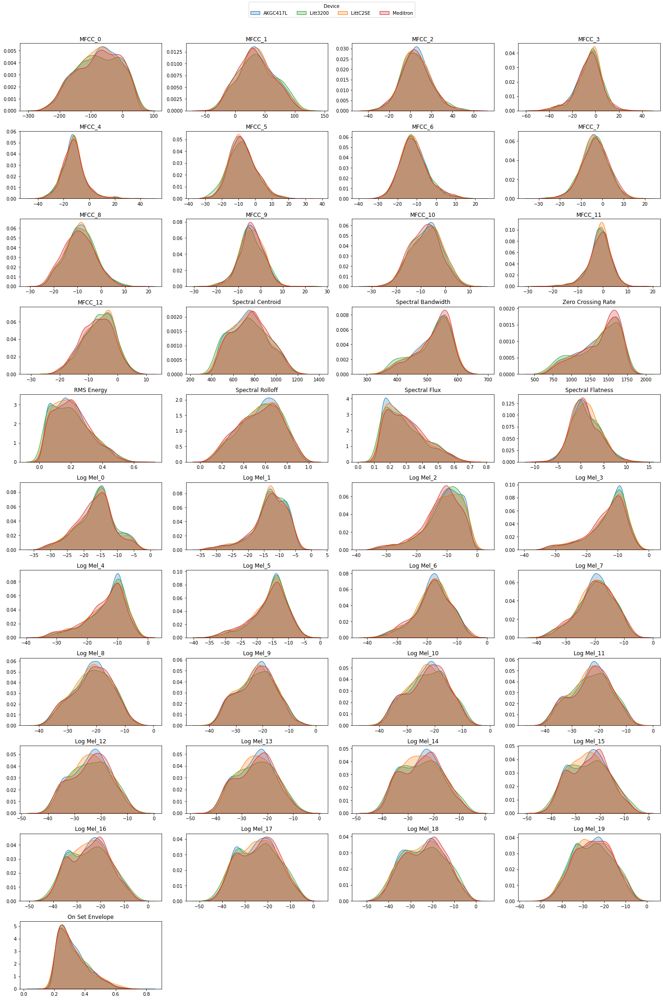

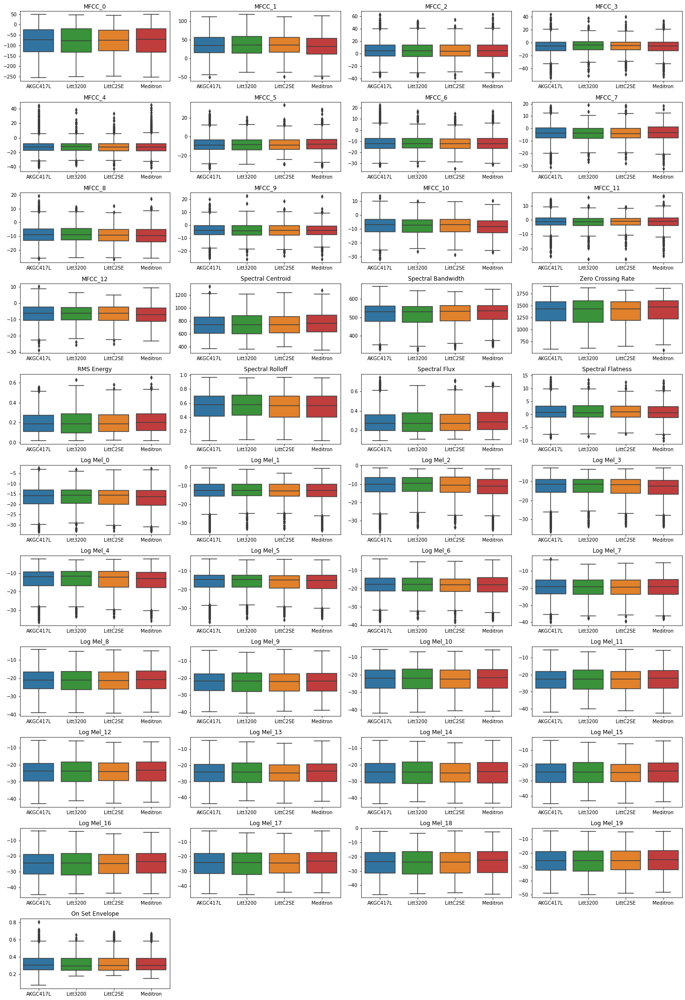

In [46]:
from utils.plots import plot_feature_distributions_by_device

training_features_std = np.load("training_features_std.npy")  
training_devices = np.load("training_devices.npy")  

plot_feature_distributions_by_device(training_features_std, training_devices, FEATURE_NAMES)

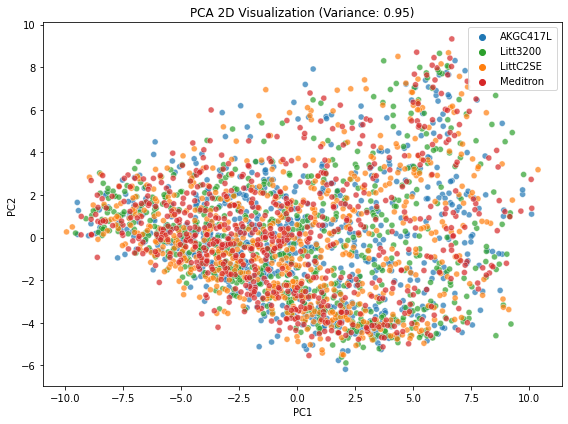

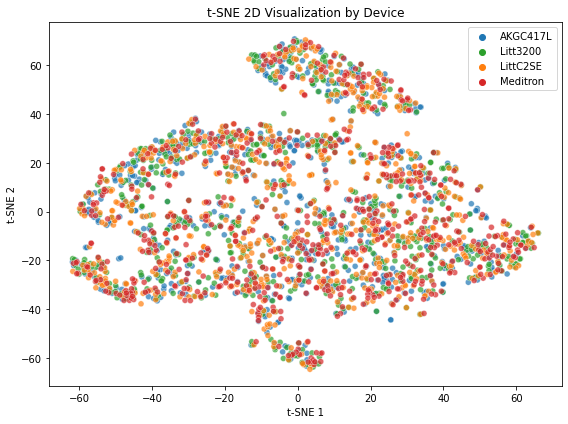

In [47]:
from utils.plots import perform_pca_and_tsne_by_device

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_std[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

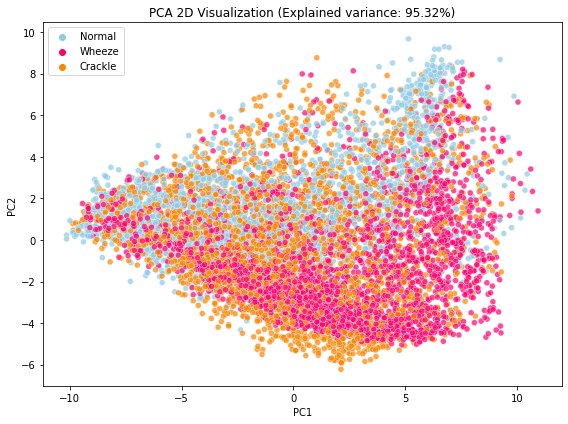

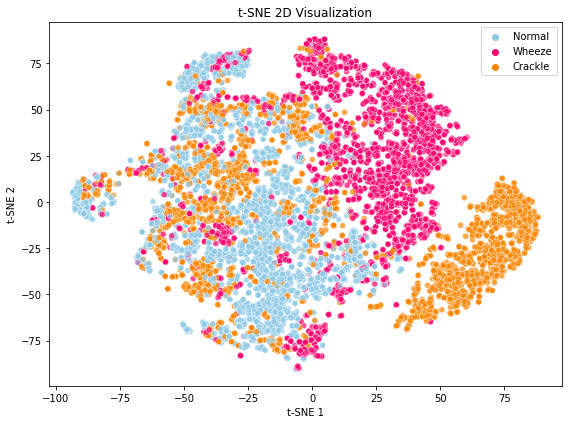

In [48]:
from utils.plots import perform_pca_and_tsne
training_labels_std = np.load("training_labels_std.npy")

perform_pca_and_tsne(
    feature_matrix=training_features_std,  # shape: (cycles, features)
    labels=training_labels_std,           # shape: (cycles,)
    pca_components=0.95,  # 95% variance
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Accuracy per fold: [0.2462 0.2557 0.2311 0.2386 0.2652]
Mean Domain Classification Accuracy: 0.2473 ± 0.0121


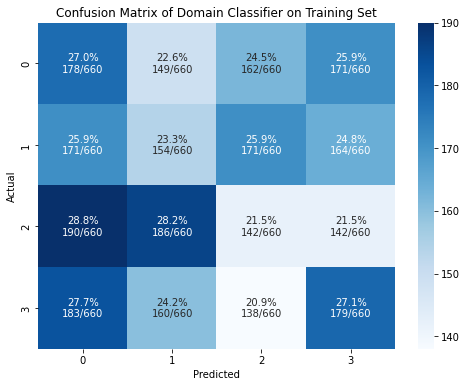

In [49]:
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features_std[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean Domain Classification Accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()

### **CLASS SPECIFIC SPECTRAL WHITENING**

In [50]:
from domain_adaptation_algorithms.spectrum_whitening import *

whitener = ClassWiseSpectralWhitening(n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

train_files = [os.path.join(RAW_CYCLE_FOLDER, f) for f in train_df["file"]]
train_labels = train_df["class"].tolist()
train_devices = [next((d for d in DEVICES if d in f), None) for f in train_df["file"]]

# Fit on raw data
whitener.fit(train_files, train_labels, train_devices, reference_device=REFERENCE_DEVICE)

Fitting whitening: 100%|██████████| 5113/5113 [00:02<00:00, 2515.45it/s]


In [51]:
# Transform on training set
WHITENED_TRAIN_FOLDER = "corrected_train_whitened"
os.makedirs(WHITENED_TRAIN_FOLDER, exist_ok=True)

for fname, label in tqdm(zip(final_train_df["file"], final_train_df["class"]), total=len(final_train_df), desc="Applying Spectrum Whitening on training set"):
    path_in = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    path_out = os.path.join(WHITENED_TRAIN_FOLDER, fname)

    if not os.path.exists(path_in):
        print(f"[!] Missing: {path_in}")
        continue

    y, _ = librosa.load(path_in, sr=SAMPLING_RATE)
    y_corr = whitener.transform(y, class_name=label)
    sf.write(path_out, y_corr, SAMPLING_RATE)

Applying Spectrum Whitening on training set: 100%|██████████| 8739/8739 [01:22<00:00, 105.74it/s]


In [52]:
# Transform on test set
WHITENED_TEST_FOLDER = "corrected_test_whitened"
os.makedirs(WHITENED_TEST_FOLDER, exist_ok=True)

for fname, label in tqdm(zip(test_df["file"], test_df["class"]), total=len(test_df), desc="Applying Spectrum Whitening on test set"):
    path_in = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    path_out = os.path.join(WHITENED_TEST_FOLDER, fname)

    if not os.path.exists(path_in):
        print(f"[!] Missing: {path_in}")
        continue

    y, _ = librosa.load(path_in, sr=SAMPLING_RATE)
    y_corr = whitener.transform(y, class_name=label)
    sf.write(path_out, y_corr, SAMPLING_RATE)

Applying Spectrum Whitening on test set: 100%|██████████| 1279/1279 [00:16<00:00, 78.10it/s]


In [53]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(WHITENED_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected training set"):
    path = os.path.join(WHITENED_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats)
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.stack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

train_features_mean = train_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("training_features_whitened.npy", train_features_mean)
np.save("training_filenames_whitened.npy", train_filenames_array)
np.save("training_labels_whitened.npy", train_labels_array)

Extracting features from corrected training set: 100%|██████████| 8739/8739 [03:56<00:00, 37.01it/s]


In [54]:
# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(WHITENED_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test set"):
    path = os.path.join(WHITENED_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats)
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays
test_features_array = np.stack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

test_features_mean = test_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("test_features_whitened.npy", test_features_mean)
np.save("test_filenames_whitened.npy", test_filenames_array)
np.save("test_labels_whitened.npy", test_labels_array)

Extracting features from corrected test set: 100%|██████████| 1279/1279 [00:33<00:00, 38.63it/s]


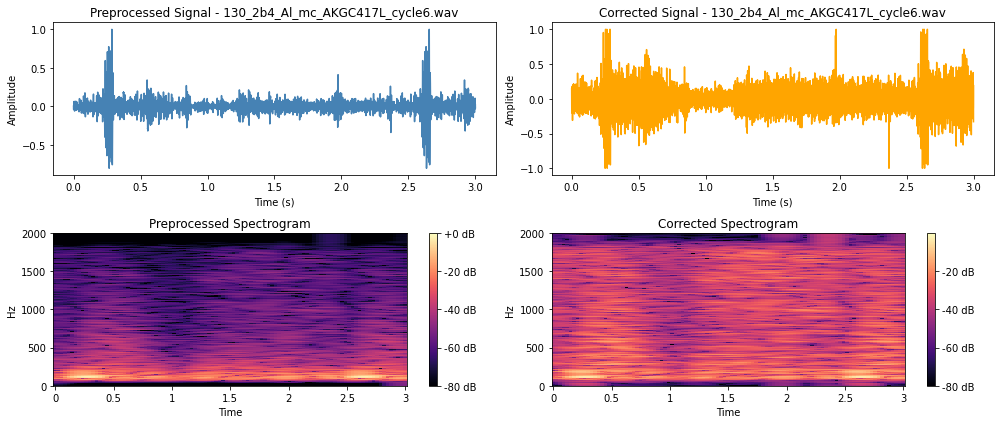

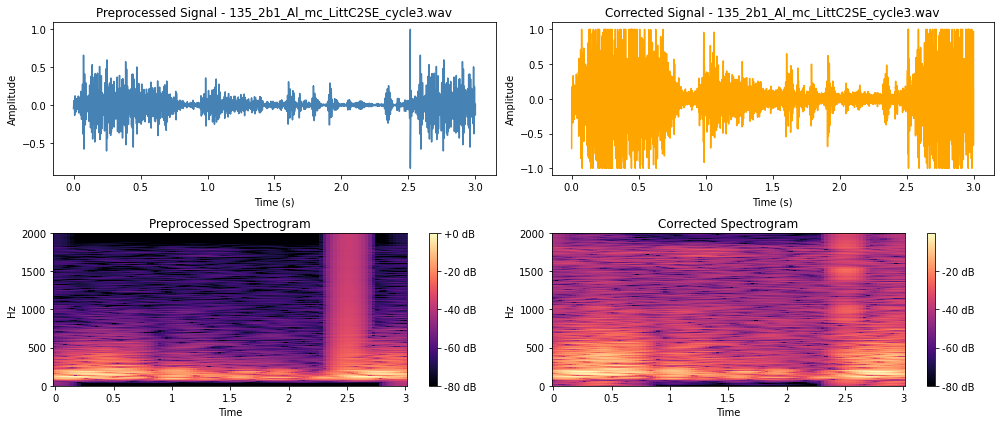

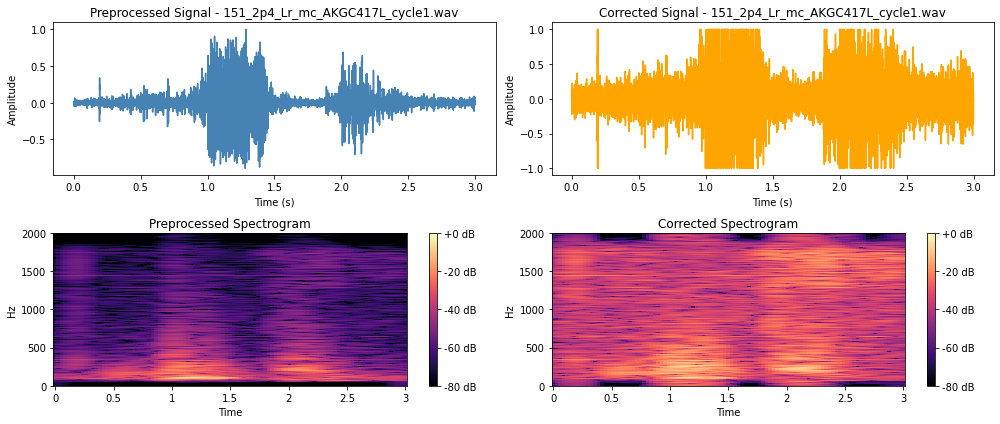

In [56]:
from utils.plots import plot_signals_after_domain_adaptation

# Get the first 3 .wav files that do not originate from the refernece device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains(REFERENCE_DEVICE)]["file"].tolist()[:3]

plot_signals_after_domain_adaptation(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=WHITENED_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

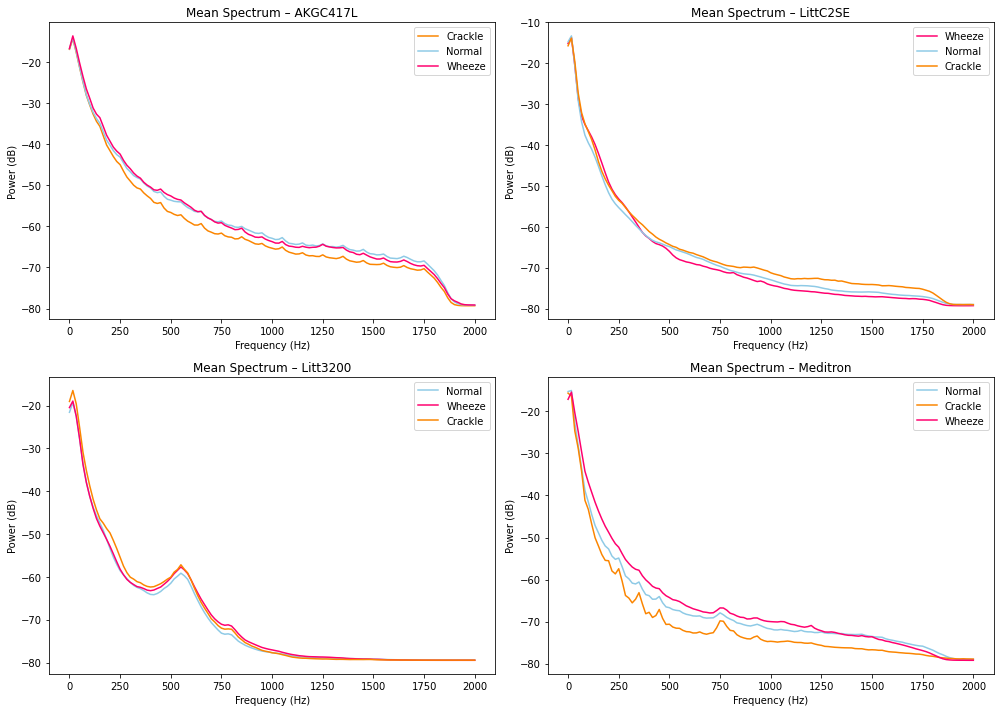

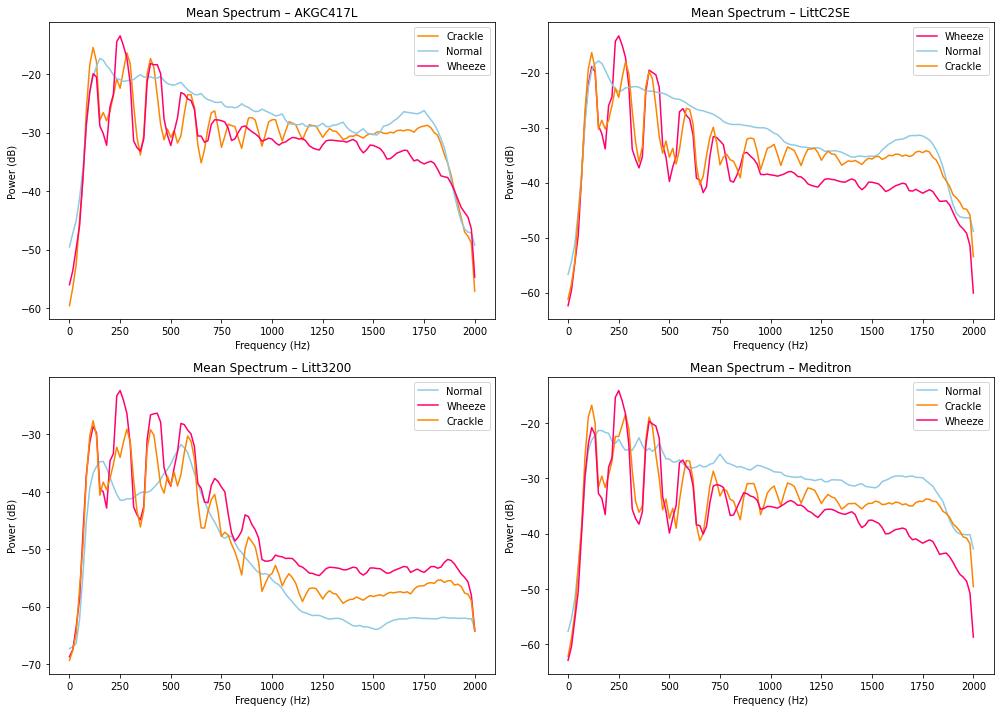

In [57]:
from utils.plots import plot_mean_spectra_per_device

plot_mean_spectra_per_device(
    folder=RAW_CYCLE_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

plot_mean_spectra_per_device(
    folder=WHITENED_TRAIN_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

In [58]:
from utils.metrics import mean_wasserstein

x_before = np.load("training_features_mean.npy")               
x_after = np.load("training_features_whitened.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

# Results per device
results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
Wasserstein distance before: 5.7836
Wasserstein distance after:  1.5475
Wasserstein relevant reduction: 73.24%

[LittC2SE → Meditron]
Wasserstein distance before: 9.0538
Wasserstein distance after:  1.5047
Wasserstein relevant reduction: 83.38%

[Litt3200 → Meditron]
Wasserstein distance before: 20.7199
Wasserstein distance after:  1.5744
Wasserstein relevant reduction: 92.40%



In [60]:
from utils.metrics import mean_js_divergence

results_js = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    dist_before = mean_js_divergence(X_src_before, X_trg_before)
    dist_after  = mean_js_divergence(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results_js[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results_js.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"JS divergence before: {vals['before']:.4f}")
    print(f"JS divergence after:  {vals['after']:.4f}")
    print(f"JS relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
JS divergence before: 0.2017
JS divergence after:  0.1240
JS relevant reduction: 38.53%

[LittC2SE → Meditron]
JS divergence before: 0.2485
JS divergence after:  0.1882
JS relevant reduction: 24.25%

[Litt3200 → Meditron]
JS divergence before: 0.4672
JS divergence after:  0.2017
JS relevant reduction: 56.82%



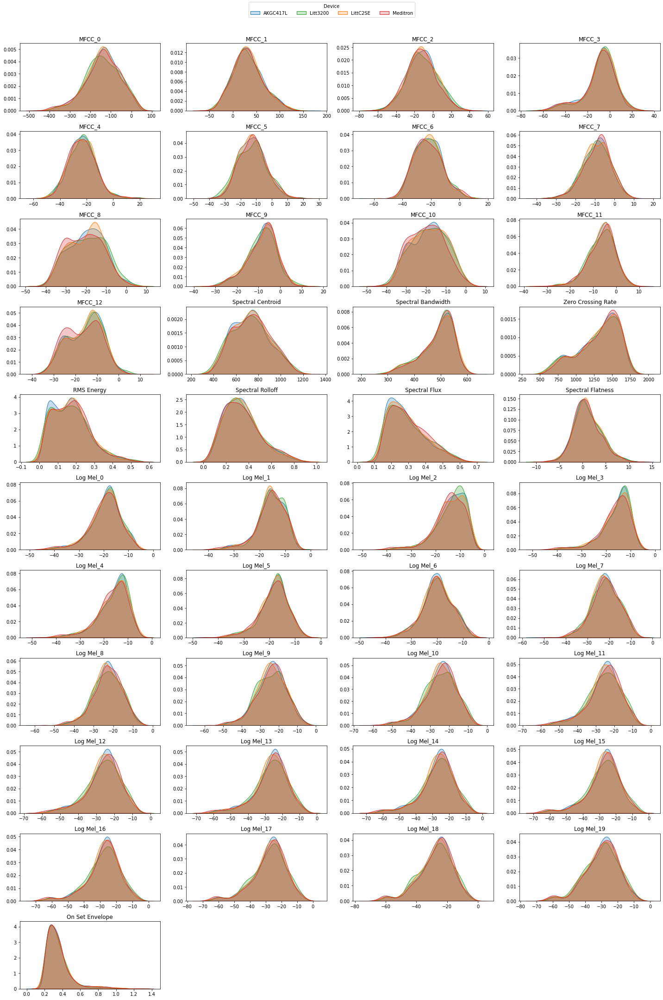

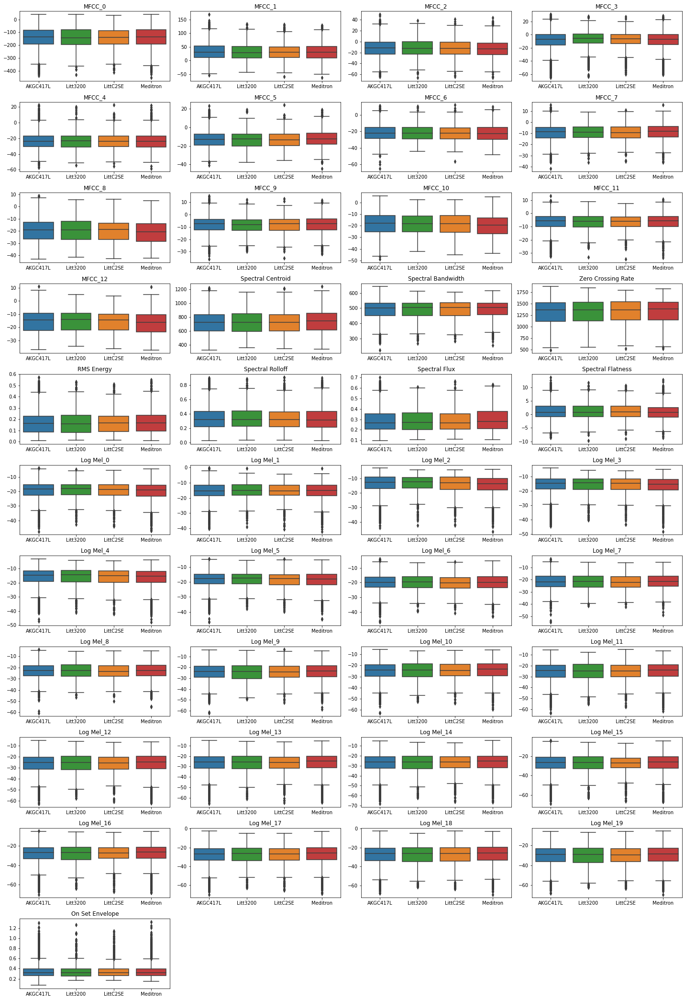

In [61]:
from utils.plots import plot_feature_distributions_by_device

training_features_whitened = np.load("training_features_whitened.npy")  
training_devices = np.load("training_devices.npy")  

plot_feature_distributions_by_device(training_features_whitened, training_devices, FEATURE_NAMES)

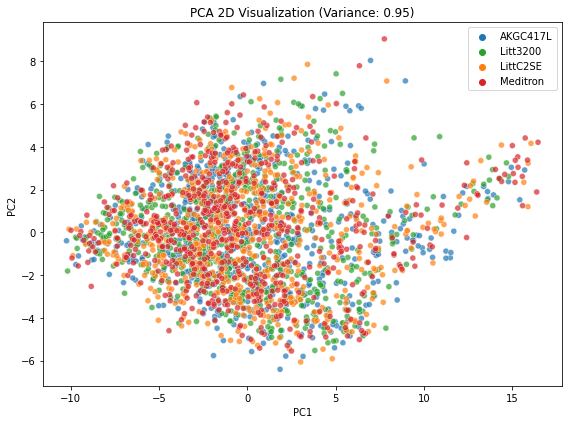

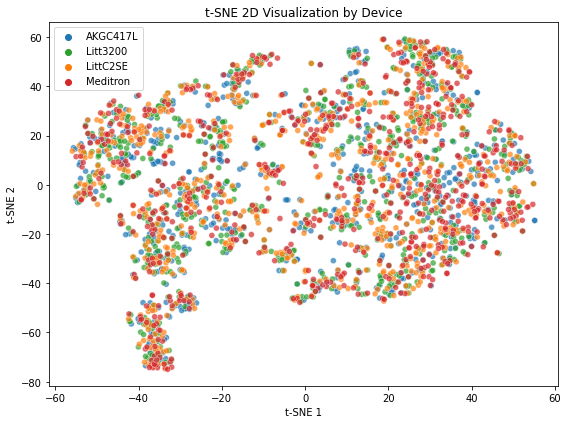

In [62]:
from utils.plots import perform_pca_and_tsne_by_device

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_whitened[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

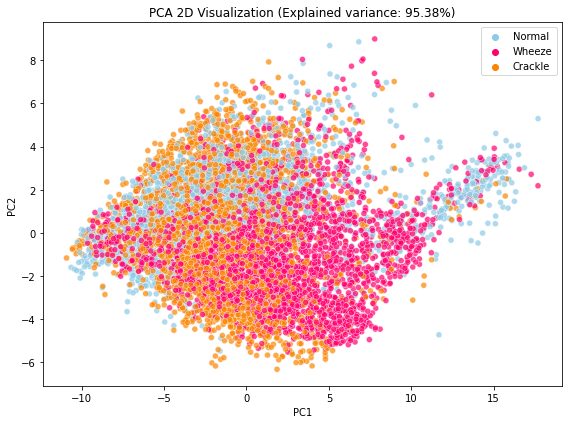

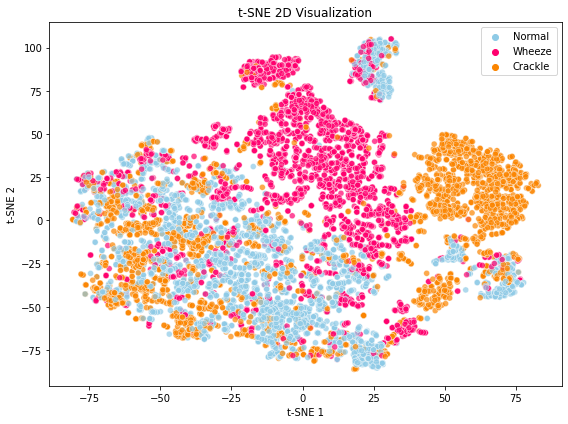

In [63]:
from utils.plots import perform_pca_and_tsne
       
training_labels_whitened = np.load("training_labels_whitened.npy")

perform_pca_and_tsne(
    feature_matrix=training_features_whitened,  # shape: (cycles, features)
    labels=training_labels_whitened,           # shape: (cycles,)
    pca_components=0.95,  # 95% variance
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Accuracy per fold: [0.2633 0.2822 0.2292 0.2216 0.2708]
Mean Domain Classification Accuracy: 0.2534 ± 0.0238


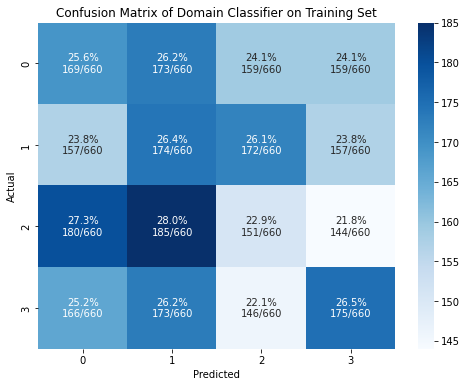

In [64]:
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features_whitened[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean Domain Classification Accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()